In [1]:
c1 = ['NGC 6823', 'Haffner 18', 'Haffner 19', 'NGC 7160',
 'NGC 6193', 'NGC 2401', 'NGC 2384', 'NGC 6871',
 'NGC 7380', 'Berkeley 7', 'Collinder 69', 'IC 4996']

In [2]:
c2 = ['Bochum 10', 'NGC 2362', 'Collinder 232', 'Hogg 10', 'NGC 6618', 'NGC 6231']

In [3]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from sklearn.neighbors import NearestNeighbors
import scipy as sp
from scipy.spatial import distance
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mpl_scatter_density 
from matplotlib.colors import LinearSegmentedColormap
from scipy.optimize import curve_fit
from sklearn.mixture import GaussianMixture
import networkx as nx
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize, StandardScaler


import warnings
warnings.filterwarnings('ignore')

# AGE of Clusters

In [4]:
clusters = pd.read_excel('../../data/open clusters table.xlsx')
clusters = clusters[['Name', 'logt']].dropna(axis=0).drop(index=0)
clusters['logt'] = clusters.logt.astype(float)


# clusters = pd.concat((clusters[clusters['Name'].isin(c1)], clusters[clusters['Name'].isin(c2)]))

clusters['Age'] = 10**clusters['logt'] 

### Sample Query

```SQL

SELECT 
	gaia_source.source_id, gaia_source.ra,
	gaia_source.ra_error, gaia_source.dec,
	gaia_source.dec_error, gaia_source.parallax,
	gaia_source.parallax_error, gaia_source.pmra, 
	gaia_source.pmdec, gaia_source.phot_g_mean_mag, 
	gaia_source.bp_rp, gaia_source.bp_g, 
	gaia_source.g_rp, gaia_source.radial_velocity, 
	gaia_source.phot_variable_flag, 
	gaia_source.l, gaia_source.b, 
	gaia_source.teff_gspphot, gaia_source.distance_gspphot, 
	gaia_source.azero_gspphot, gaia_source.ag_gspphot, 
	gaia_source.ebpminrp_gspphot,
	edr3d.r_med_geo, edr3d.r_med_photogeo
FROM gaiadr3.gaia_source 
LEFT JOIN external.gaiaedr3_distance AS edr3d ON (gaia_source.source_id = edr3d.source_id )
WHERE 
CONTAINS(
    POINT('ICRS',gaiadr3.gaia_source.ra,gaiadr3.gaia_source.dec),
    CIRCLE(
        'ICRS',
        COORD1(EPOCH_PROP_POS(295.794,23.321,.4460,-1.6970,-5.3040,29.9300,2000,2016.0)),
        COORD2(EPOCH_PROP_POS(295.794,23.321,.4460,-1.6970,-5.3040,29.9300,2000,2016.0)),
        0.13333333333333333)
)=1

```

# Functions

In [5]:
def preprocess_cluster(data, g_mean_th=18):
    """
    ------
    parallax > 0 

    phot_g_mean_mag < g_mean_th
    ------
    """
    data = data[data['parallax'] > 0]
    data = data[data['phot_g_mean_mag'] < g_mean_th]
    data['Gmg'] = data['phot_g_mean_mag'] + (5 * np.log10(data['parallax']) - 10)
    data['L'] = 10**(0.4*(4.83 - data['Gmg']))
    data = data[(abs(data['pmra']) < 10) & (abs(data['pmdec']) < 10)]
    print(len(data))
    return data


def cmd_plot(data, x_axis, y_axis, alpha=0.8, s=5):
    """
    -------
    plot isochrone
    -------
    """

    with plt.style.context(['ieee']):
        fig = plt.figure(figsize=(6,6), dpi=100)
        sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s)
        plt.gca().invert_yaxis();
        
        
def joint_plot(data):

    plt.figure(dpi=90)
    sns.jointplot(
        data=data,
        x="pmra", y="pmdec",
        kind="kde"
        )
    plt.show()
    
    
def fit_curve(data, column, bins = 100):

    plt.figure(figsize=(8,2), dpi=80)
    counts, bins, patches = plt.hist(data[column], bins = bins)

    # Define the Gaussian function
    def gaussian(x, amp, mu, sigma):
        return amp * np.exp(-(x - mu)**2 / (2 * sigma**2))
    
    # data
    x_data = bins[:-1]
    y_data = counts
    
    # Fit the Gaussian function to the data
    popt, pcov = curve_fit(gaussian, x_data, y_data, maxfev=5000)
    
    plt.figure(figsize=(8,2), dpi=80)
    # Plot the original data and the fitted curve
    sns.scatterplot(x_data, y_data, label=column)
    plt.plot(x_data, gaussian(x_data, *popt), color='red', label='Fit')
    plt.legend()
    plt.show()
    
    return popt


def guassian_filter(data, column, mu, std):    
    up = round(mu + 3 * std, 2)
    low = round(mu - 3 * std, 2)
    
    if up > low:
        print(f'{column} upper bound:', up) 
        print(f'{column} lower bound:', low)
        df = data[(data[column] < up) & (data[column] > low)]
    else:
        print(f'{column} upper bound:', low) 
        print(f'{column} lower bound:', up)
        df = data[(data[column]< low) & (data[column] > up)]
    
    print('cluster length:', len(df))
    return df


def luminosity_density(cluster_3d, clusterdf):
    """
    --------
    cluster_3d --> measuring distance in that dataframe
    
    clusterdf --> main dataframe
    -------
    """
    # create a NearestNeighbors object and fit the dataset
    nbrs = NearestNeighbors(n_neighbors=6, metric='minkowski').fit(cluster_3d)

    # find the 5 nearest neighbors for each data point including itself
    distances, indices = nbrs.kneighbors(cluster_3d)

    # find maximum distance among 5 neighbors
    max_distances = np.amax(distances, axis=1)

    # sphere of that max distance
    spheres = (4/3) * np.pi * (max_distances ** 3)

    # sum of luminosities of each 6 nn
    lum_sum = []
    for i in range(len(clusterdf)):
        lum_sum.append(np.sum(clusterdf.iloc[indices[i]]['L']))

    # luminosity density
    lum_dens = lum_sum / spheres

    return lum_dens



def lum_plot(data):
    """
    --------
    plot for luminosity density profile
    --------
    """    
    
    with plt.style.context(['ieee']):
        plt.figure(figsize=(12,6), dpi=200)
        plt.plot(range(len(data)), np.sort(data))
        plt.ylabel('ΔL/ΔV')
        plt.title('luminosity density profile');

# DATA

In [6]:
df_NGC_6823 = pd.read_csv('../../data/NGC 6823-result.csv')
df_Haffner_18 = pd.read_csv('../../data/Haffner 18-result.csv')
df_Haffner_19 = pd.read_csv('../../data/Haffner 19-result.csv')
df_NGC_7160 = pd.read_csv('../../data/NGC 7160-result.csv')
df_NGC_6193 = pd.read_csv('../../data/NGC 6193-result.csv')
df_NGC_2401 = pd.read_csv('../../data/NGC 2401-result.csv')
df_NGC_2384 = pd.read_csv('../../data/NGC 2384-result.csv')
df_NGC_6871 = pd.read_csv('../../data/NGC 6871-result.csv')
df_NGC_7380 = pd.read_csv('../../data/NGC 7380-result.csv')
df_Berkeley_7 = pd.read_csv('../../data/Berkeley 7-result.csv')
df_Collinder_69  = pd.read_csv('../../data/Collinder 69-result.csv')
df_IC_4996 = pd.read_csv('../../data/IC 4996-result.csv')

In [7]:
df_Bochum_10 = pd.read_csv('../../data/Bochum 10-result.csv')
df_NGC_2362 = pd.read_csv('../../data/NGC 2362-result.csv') 
df_Collinder_232 = pd.read_csv('../../data/Collinder 232-result.csv')
df_Hogg_10 = pd.read_csv('../../data/Hogg 10-result.csv')
df_NGC_6618 =  pd.read_csv('../../data/NGC 6618-result.csv')
df_NGC_6231 = pd.read_csv('../../data/NGC 6231-result.csv')

### Preprocess

In [8]:
df_NGC_6823 = preprocess_cluster(df_NGC_6823, g_mean_th=19)
df_Haffner_18 = preprocess_cluster(df_Haffner_18, g_mean_th=19)
df_Haffner_19 = preprocess_cluster(df_Haffner_19, g_mean_th=19)
df_NGC_7160 = preprocess_cluster(df_NGC_7160, g_mean_th=19)
df_NGC_6193 = preprocess_cluster(df_NGC_6193, g_mean_th=19)
df_NGC_2401 = preprocess_cluster(df_NGC_2401, g_mean_th=19)
df_NGC_2384 = preprocess_cluster(df_NGC_2384, g_mean_th=19)
df_NGC_6871 = preprocess_cluster(df_NGC_6871, g_mean_th=19)
df_NGC_7380 = preprocess_cluster(df_NGC_7380, g_mean_th=19)
df_Berkeley_7 = preprocess_cluster(df_Berkeley_7, g_mean_th=19)
df_Collinder_69 = preprocess_cluster(df_Collinder_69, g_mean_th=19)
df_IC_4996 = preprocess_cluster(df_IC_4996, g_mean_th=19)
df_Bochum_10 = preprocess_cluster(df_Bochum_10, g_mean_th=19)
df_NGC_2362 = preprocess_cluster(df_NGC_2362, g_mean_th=19)
df_Collinder_232 = preprocess_cluster(df_Collinder_232, g_mean_th=19)
df_Hogg_10 = preprocess_cluster(df_Hogg_10, g_mean_th=19)
df_NGC_6618 = preprocess_cluster(df_NGC_6618, g_mean_th=19)
df_NGC_6231 = preprocess_cluster(df_NGC_6231, g_mean_th=19)

1149
2220
865
5325
16330
451
1638
104749
5760
1594
113946
1362
4180
2064
4369
2267
699
12942


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Times


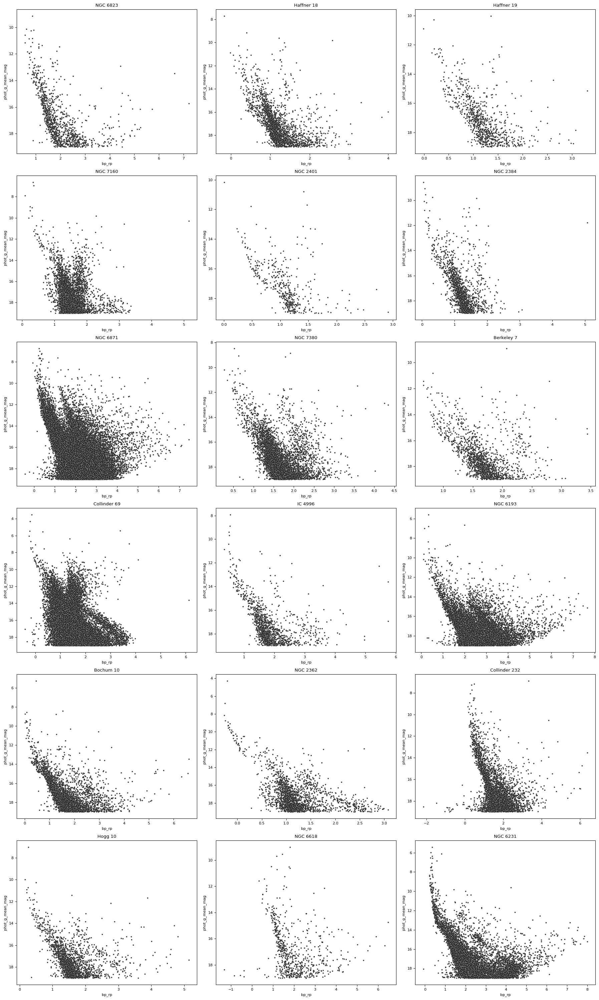

In [9]:
def cmd_plotly(data, x_axis, y_axis, ax=None, alpha=0.8, s=8):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)
    ax.invert_yaxis()


with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    cmd_plotly(df_NGC_6823, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

### columns

## dropping some columns

In [10]:
df_Bochum_10.columns

Index(['source_id', 'ra', 'ra_error', 'dec', 'dec_error', 'parallax',
       'parallax_error', 'pmra', 'pmdec', 'phot_g_mean_mag', 'bp_rp', 'bp_g',
       'g_rp', 'radial_velocity', 'phot_variable_flag', 'l', 'b',
       'teff_gspphot', 'distance_gspphot', 'azero_gspphot', 'ag_gspphot',
       'ebpminrp_gspphot', 'r_med_geo', 'r_med_photogeo', 'Gmg', 'L'],
      dtype='object')

In [11]:
def drop_columns(data):
    return data.drop(['source_id', 'ra_error', 'dec_error', 'parallax_error',
                      'radial_velocity', 'phot_variable_flag', 'l', 'b',
                      'teff_gspphot', 'distance_gspphot', 'azero_gspphot', 'ag_gspphot',
                      'ebpminrp_gspphot', 'r_med_photogeo', 'Gmg', 'L'], axis=1).dropna(axis=0)

In [12]:
df_NGC_6823_new = drop_columns(df_NGC_6823)
df_Haffner_18_new = drop_columns(df_Haffner_18)
df_Haffner_19_new = drop_columns(df_Haffner_19)
df_NGC_7160_new = drop_columns(df_NGC_7160)
df_NGC_6193_new = drop_columns(df_NGC_6193)
df_NGC_2401_new = drop_columns(df_NGC_2401)
df_NGC_2384_new = drop_columns(df_NGC_2384)
df_NGC_6871_new = drop_columns(df_NGC_6871)
df_NGC_7380_new = drop_columns(df_NGC_7380)
df_Berkeley_7_new = drop_columns(df_Berkeley_7)
df_Collinder_69_new = drop_columns(df_Collinder_69)
df_IC_4996_new = drop_columns(df_IC_4996)
df_Bochum_10_new = drop_columns(df_Bochum_10)
df_NGC_2362_new = drop_columns(df_NGC_2362)
df_Collinder_232_new = drop_columns(df_Collinder_232)
df_Hogg_10_new = drop_columns(df_Hogg_10)
df_NGC_6618_new = drop_columns(df_NGC_6618)
df_NGC_6231_new = drop_columns(df_NGC_6231)

### Clusters' proper motions

In [13]:
# import requests

# for cluster_name in c1:
#     url = f"https://simbad.u-strasbg.fr/simbad/sim-basic?Ident={cluster_name}&submit=SIMBAD+search"
#     html = requests.get(url).content
#     df_list = pd.read_html(html)
#     df = df_list[2].iloc[1][0]
#     index = df_list[2].iloc[1][0].find('Proper motions')
#     print(cluster_name)
#     print(df[index:index+35])
#     print()

# for cluster_name in c2:
#     url = f"https://simbad.u-strasbg.fr/simbad/sim-basic?Ident={cluster_name}&submit=SIMBAD+search"
#     html = requests.get(url).content
#     df_list = pd.read_html(html)
#     df = df_list[2].iloc[1][0]
#     index = df_list[2].iloc[1][0].find('Proper motions')
#     print(cluster_name)
#     print(df[index:index+35])
#     print()

```
NGC 6823
Proper motions mas/yr : -1.697 -5.3

Haffner 18
Proper motions mas/yr : -2.548 2.67

Haffner 19
Proper motions mas/yr : -2.494 2.50

NGC 7160
Proper motions mas/yr : -3.472 -1.3

NGC 6193
Proper motions mas/yr : 1.278 -4.11

NGC 2401
Proper motions mas/yr : -1.370 1.67

NGC 2384
Proper motions mas/yr : -3.99 2.28 

NGC 6871
Proper motions mas/yr : -3.129 -6.4

NGC 7380
Proper motions mas/yr : -2.517 -2.1

Berkeley 7
Proper motions mas/yr : -0.993 -0.1

Collinder 69
Proper motions mas/yr : 1.194 -2.11

IC 4996
Proper motions mas/yr : -2.681 -5.3
```

```
Bochum 10
Proper motions mas/yr : -5.09 3.48 

NGC 2362
Proper motions mas/yr : -2.791 2.95

Collinder 232
Proper motions mas/yr : -4.79 4.14 

Hogg 10
Proper motions mas/yr : -6.201 1.75

NGC 6618
Proper motions mas/yr : 1.510 -1.74

NGC 6231
Proper motions mas/yr : -0.529 -2.1

```

-----

## filter on proper motions

In [14]:
# Initial Filter on PMRA and PMDEC 

def filter_proper_motion(data, pmra, pmdec, d_pmra=1.2, d_pmdec=1.2):
    return data[(abs(data['pmra'] - pmra) < d_pmra) & (abs(data['pmdec'] - pmdec) < d_pmdec)]

def filter_parallax(data, parallax, delta = 0.5):
    return data[(abs(data['parallax'] - parallax) < delta)]

In [15]:
#### TEMP CODE
df_NGC_6823_new = drop_columns(df_NGC_6823)
df_Haffner_18_new = drop_columns(df_Haffner_18)
df_Haffner_19_new = drop_columns(df_Haffner_19)
df_NGC_7160_new = drop_columns(df_NGC_7160)
df_NGC_6193_new = drop_columns(df_NGC_6193)
df_NGC_2401_new = drop_columns(df_NGC_2401)
df_NGC_2384_new = drop_columns(df_NGC_2384)
df_NGC_6871_new = drop_columns(df_NGC_6871)
df_NGC_7380_new = drop_columns(df_NGC_7380)
df_Berkeley_7_new = drop_columns(df_Berkeley_7)
df_Collinder_69_new = drop_columns(df_Collinder_69)
df_IC_4996_new = drop_columns(df_IC_4996)
df_Bochum_10_new = drop_columns(df_Bochum_10)
df_NGC_2362_new = drop_columns(df_NGC_2362)
df_Collinder_232_new = drop_columns(df_Collinder_232)
df_Hogg_10_new = drop_columns(df_Hogg_10)
df_NGC_6618_new = drop_columns(df_NGC_6618)
df_NGC_6231_new = drop_columns(df_NGC_6231)

In [16]:
df_NGC_6823_new = filter_proper_motion(df_NGC_6823_new, -1.697, -5.3)
df_Haffner_18_new = filter_proper_motion(df_Haffner_18_new, -2.548, 2.67, d_pmdec=.7)
df_Haffner_19_new = filter_proper_motion(df_Haffner_19_new, -2.494, 2.50, d_pmdec=.7)
df_NGC_7160_new = filter_proper_motion(df_NGC_7160_new, -3.472, -1.3, 0.8, .8)
df_NGC_6193_new = filter_proper_motion(df_NGC_6193_new, 1.278, -4.11)
df_NGC_2401_new = filter_proper_motion(df_NGC_2401_new, -1.370, 1.67)
df_NGC_2384_new = filter_proper_motion(df_NGC_2384_new, -3.99, 3.28, d_pmra=2,d_pmdec=1.)
df_NGC_6871_new = filter_proper_motion(df_NGC_6871_new, -3.129, -6.4, d_pmra=0.5, d_pmdec=1.2)
df_NGC_7380_new = filter_proper_motion(df_NGC_7380_new, -2.517, -2.1, d_pmra=0.5)
df_Berkeley_7_new = filter_proper_motion(df_Berkeley_7_new, -0.993, -0.1, d_pmra=0.5, d_pmdec=0.5)
df_Collinder_69_new = filter_proper_motion(df_Collinder_69_new, 1.194, -2.11, 1.5, 1.2)
df_IC_4996_new = filter_proper_motion(df_IC_4996_new, -2.681, -5.3, d_pmdec=1)
df_Bochum_10_new = filter_proper_motion(df_Bochum_10_new, -5.09, 3.48, 0.9, 1.1)
df_NGC_2362_new = filter_proper_motion(df_NGC_2362_new, -2.791, 2.95, 0.5, 0.5)
df_Collinder_232_new = filter_proper_motion(df_Collinder_232_new, -4.79, 4.14, d_pmra=2, d_pmdec=3)
df_Hogg_10_new = filter_proper_motion(df_Hogg_10_new, -6.201, 1.75, d_pmra=.5, d_pmdec=.5)
# df_NGC_6618_new = filter_proper_motion(df_NGC_6618_new, 1.510, -1.74)
df_NGC_6231_new = filter_proper_motion(df_NGC_6231_new, -0.529, -2.1, .5, .5)


df_NGC_7160_new = filter_parallax(df_NGC_7160_new, 1.050) # filter parallax
df_NGC_6871_new = filter_parallax(df_NGC_6871_new, 0.514, .2) # filter parallax
df_Collinder_69_new = filter_parallax(df_Collinder_69_new, 2.462, .5) # filter parallax
df_IC_4996_new = filter_parallax(df_IC_4996_new, 0.487) # filter parallax
df_NGC_6231_new = filter_parallax(df_NGC_6231_new, 0.487, 0.2) # filter parallax

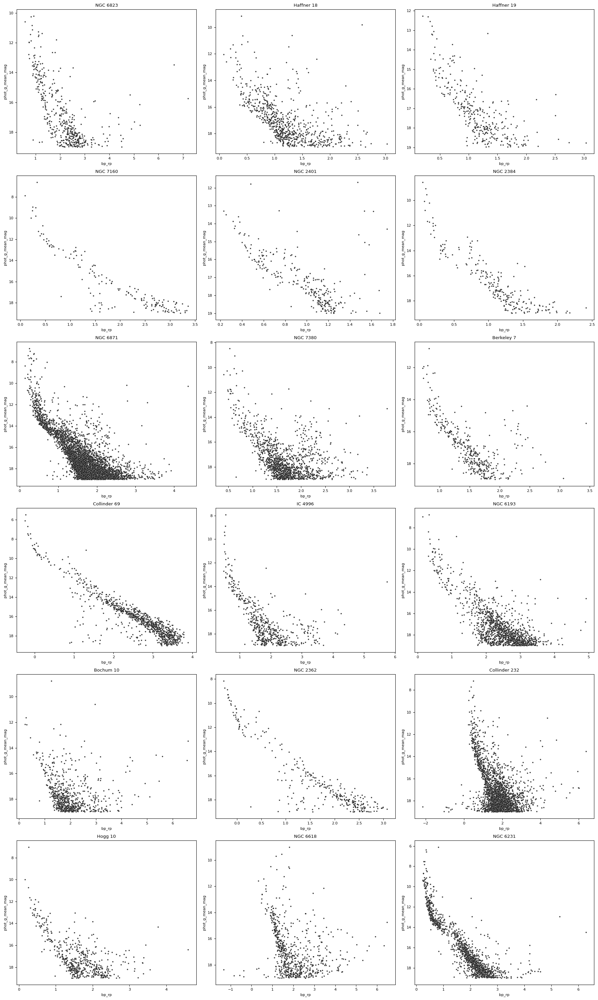

In [17]:
with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    cmd_plotly(df_NGC_6823_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

# fitting guassians on the data

In [18]:
sns.set_style('ticks')

In [19]:
def namestr(obj, namespace):
    return [name for name in namespace if namespace[name] is obj] # print name of variable

def guassian_fit_filter(data, parameter, num_bins=80):
    print('\n',namestr(data, globals())[0])
    amp, mu, std = fit_curve(data, parameter, bins=num_bins)
    return guassian_filter(data, parameter, mu, std)

### pmdec


 df_NGC_6823_new


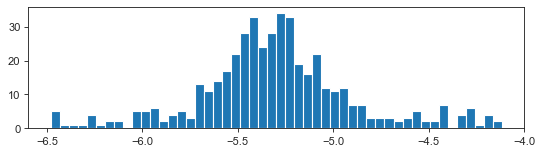

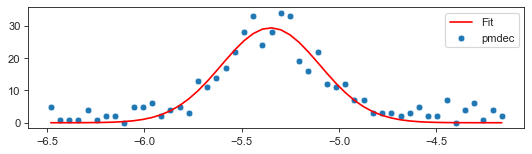

pmdec upper bound: -4.59
pmdec lower bound: -6.11
cluster length: 407

 df_Haffner_18_new


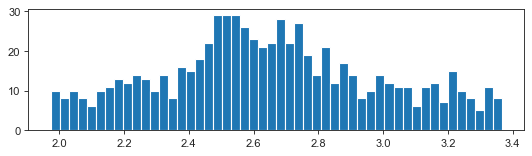

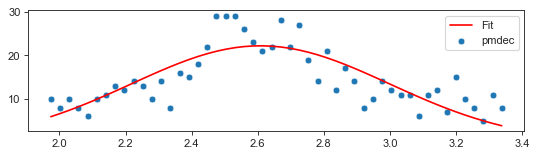

pmdec upper bound: 3.78
pmdec lower bound: 1.44
cluster length: 730

 df_Haffner_19_new


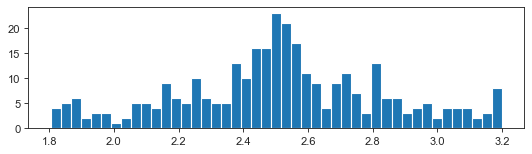

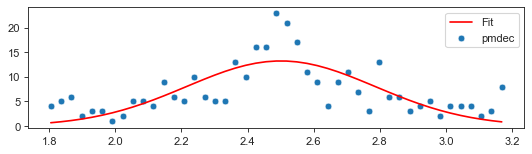

pmdec upper bound: 3.36
pmdec lower bound: 1.64
cluster length: 320

 df_NGC_7160_new


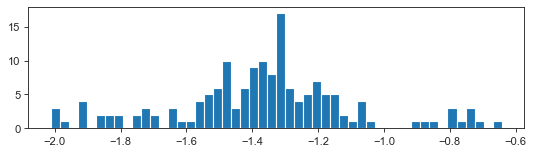

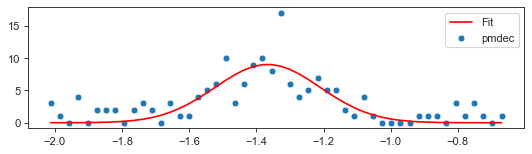

pmdec upper bound: -0.9
pmdec lower bound: -1.84
cluster length: 133

 df_NGC_6193_new


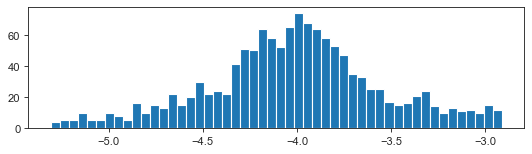

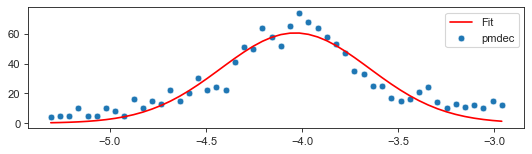

pmdec upper bound: -2.88
pmdec lower bound: -5.19
cluster length: 1309

 df_NGC_2401_new


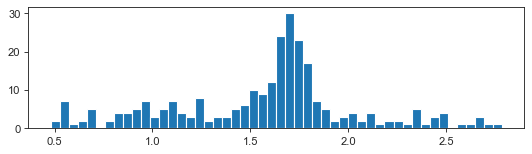

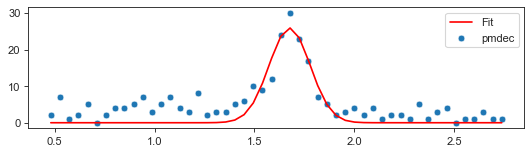

pmdec upper bound: 1.98
pmdec lower bound: 1.37
cluster length: 154

 df_NGC_2384_new


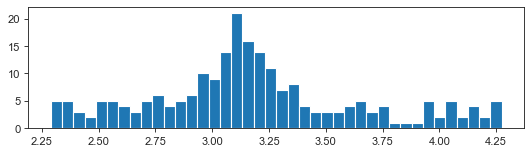

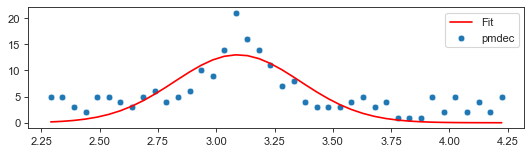

pmdec upper bound: 3.9
pmdec lower bound: 2.28
cluster length: 199

 df_NGC_6871_new


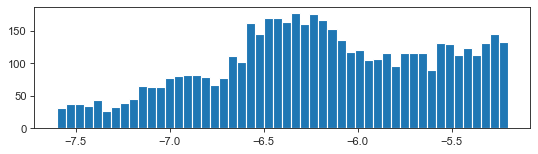

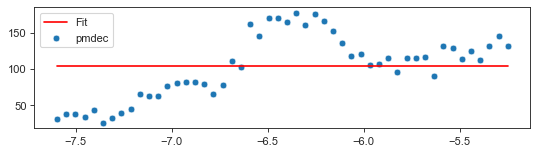

pmdec upper bound: 352321540.0
pmdec lower bound: -352321538.0
cluster length: 5167

 df_NGC_7380_new


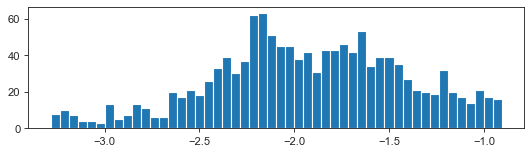

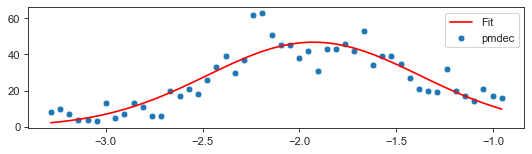

pmdec upper bound: -0.28
pmdec lower bound: -3.58
cluster length: 1313

 df_Berkeley_7_new


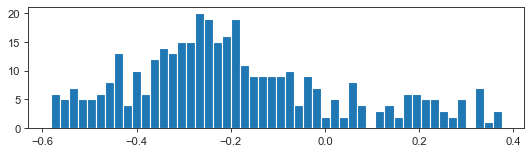

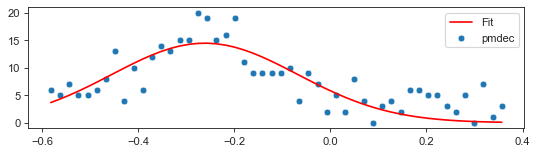

pmdec upper bound: 0.32
pmdec lower bound: -0.84
cluster length: 372

 df_Collinder_69_new


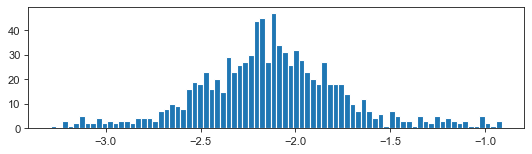

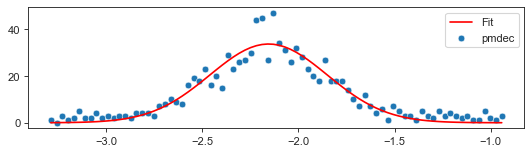

pmdec upper bound: -1.24
pmdec lower bound: -3.07
cluster length: 890

 df_IC_4996_new


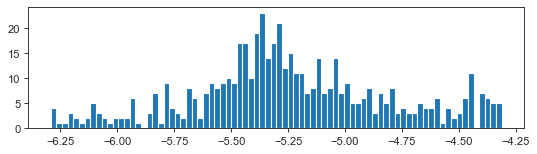

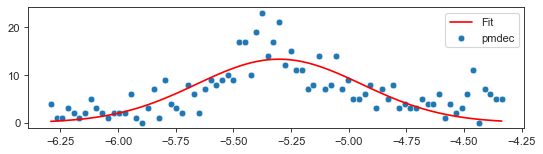

pmdec upper bound: -4.23
pmdec lower bound: -6.38
cluster length: 525

 df_Bochum_10_new


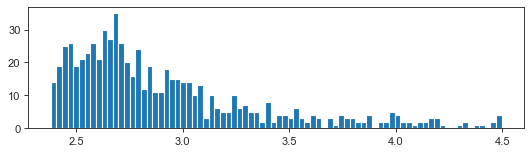

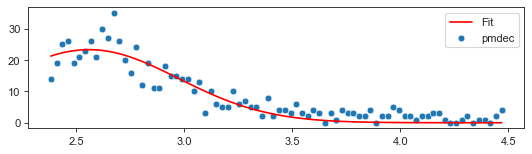

pmdec upper bound: 3.8
pmdec lower bound: 1.32
cluster length: 640

 df_NGC_2362_new


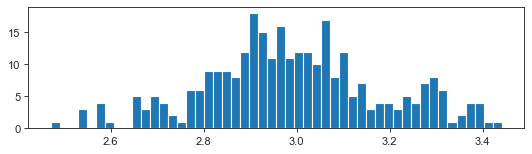

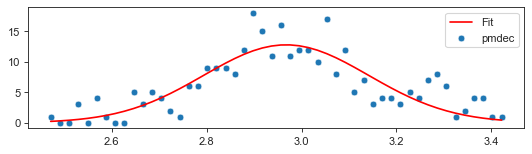

pmdec upper bound: 3.49
pmdec lower bound: 2.44
cluster length: 299

 df_Collinder_232_new


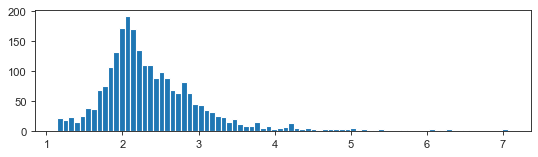

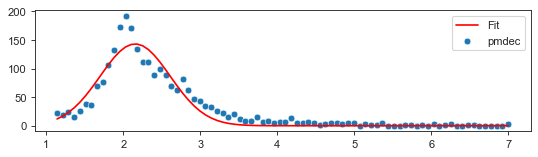

pmdec upper bound: 3.52
pmdec lower bound: 0.79
cluster length: 2253

 df_Hogg_10_new


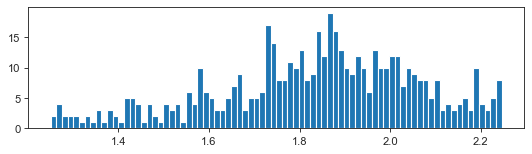

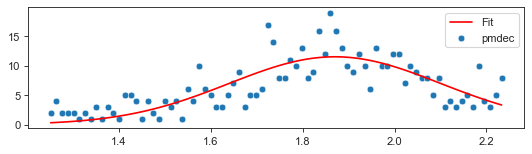

pmdec upper bound: 2.56
pmdec lower bound: 1.18
cluster length: 522

 df_NGC_6618_new


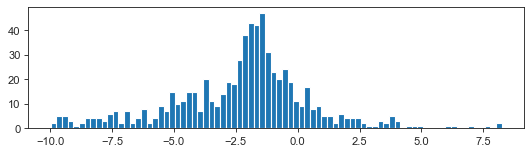

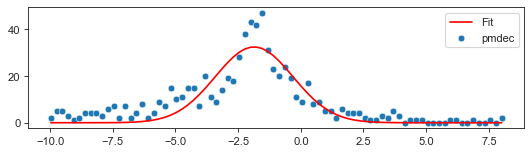

pmdec upper bound: 2.79
pmdec lower bound: -6.52
cluster length: 599

 df_NGC_6231_new


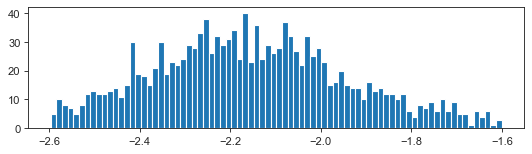

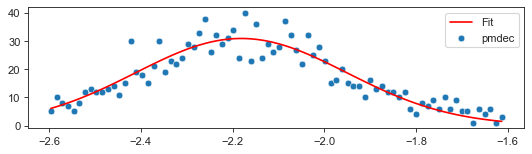

pmdec upper bound: -1.49
pmdec lower bound: -2.87
cluster length: 1391


In [20]:
df_NGC_6823_new = guassian_fit_filter(df_NGC_6823_new, 'pmdec', num_bins=50)
df_Haffner_18_new = guassian_fit_filter(df_Haffner_18_new, 'pmdec', num_bins=50)
df_Haffner_19_new = guassian_fit_filter(df_Haffner_19_new, 'pmdec', num_bins=45)
df_NGC_7160_new = guassian_fit_filter(df_NGC_7160_new, 'pmdec', num_bins=50)
df_NGC_6193_new = guassian_fit_filter(df_NGC_6193_new, 'pmdec', 50)
df_NGC_2401_new = guassian_fit_filter(df_NGC_2401_new, 'pmdec', num_bins=50)
df_NGC_2384_new = guassian_fit_filter(df_NGC_2384_new, 'pmdec', num_bins=40)
df_NGC_6871_new = guassian_fit_filter(df_NGC_6871_new, 'pmdec', num_bins=50)
df_NGC_7380_new = guassian_fit_filter(df_NGC_7380_new, 'pmdec', num_bins=50)
df_Berkeley_7_new = guassian_fit_filter(df_Berkeley_7_new, 'pmdec', num_bins=50)
df_Collinder_69_new = guassian_fit_filter(df_Collinder_69_new, 'pmdec')
df_IC_4996_new = guassian_fit_filter(df_IC_4996_new, 'pmdec')
df_Bochum_10_new = guassian_fit_filter(df_Bochum_10_new, 'pmdec')
df_NGC_2362_new = guassian_fit_filter(df_NGC_2362_new, 'pmdec', 50)
df_Collinder_232_new = guassian_fit_filter(df_Collinder_232_new, 'pmdec')
df_Hogg_10_new = guassian_fit_filter(df_Hogg_10_new, 'pmdec')
df_NGC_6618_new = guassian_fit_filter(df_NGC_6618_new, 'pmdec')
df_NGC_6231_new = guassian_fit_filter(df_NGC_6231_new, 'pmdec')


 df_NGC_6823_new


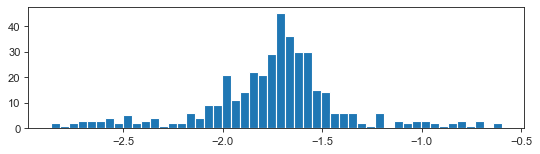

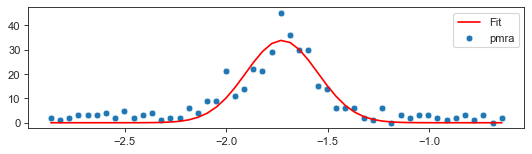

pmra upper bound: -1.2
pmra lower bound: -2.26
cluster length: 345

 df_Haffner_18_new


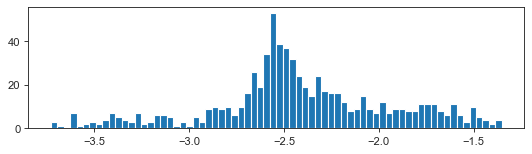

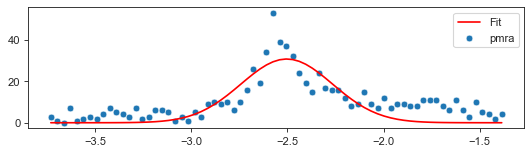

pmra upper bound: -1.79
pmra lower bound: -3.22
cluster length: 589

 df_Haffner_19_new


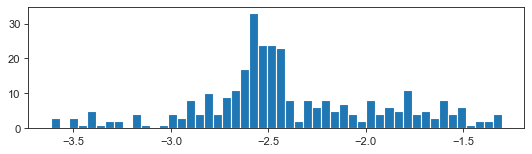

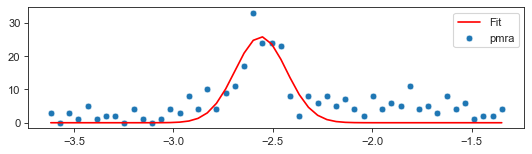

pmra upper bound: -2.17
pmra lower bound: -2.95
cluster length: 203

 df_NGC_7160_new


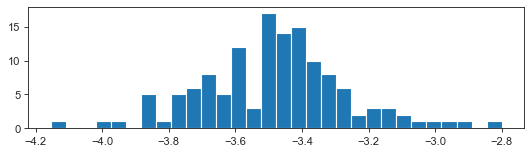

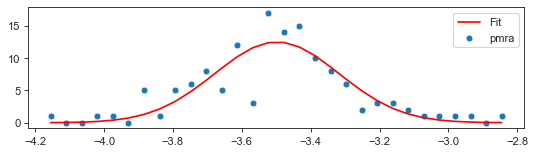

pmra upper bound: -2.96
pmra lower bound: -4.04
cluster length: 130

 df_NGC_6193_new


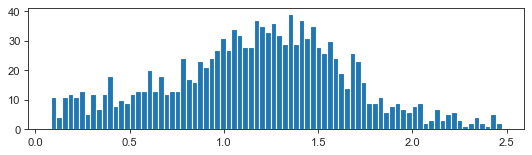

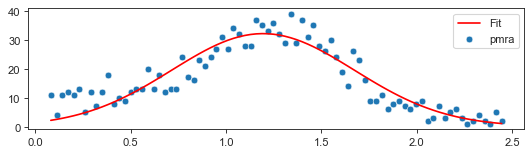

pmra upper bound: 2.63
pmra lower bound: -0.24
cluster length: 1309

 df_NGC_2401_new


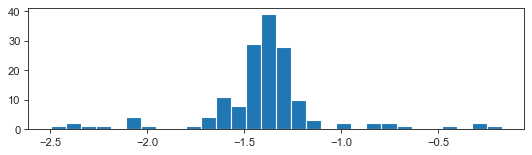

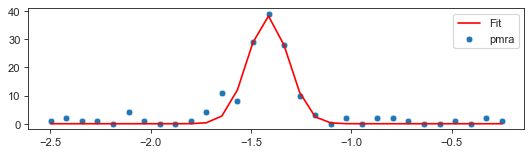

pmra upper bound: -1.11
pmra lower bound: -1.72
cluster length: 132

 df_NGC_2384_new


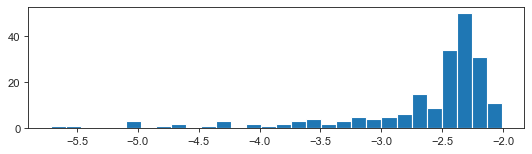

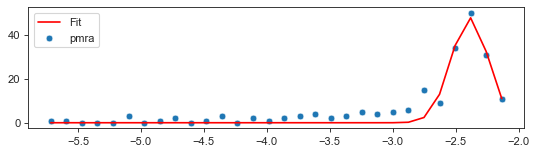

pmra upper bound: -1.94
pmra lower bound: -2.83
cluster length: 154

 df_NGC_6871_new


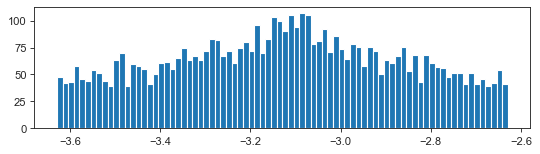

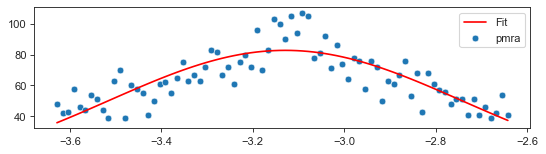

pmra upper bound: -1.97
pmra lower bound: -4.29
cluster length: 5167

 df_NGC_7380_new


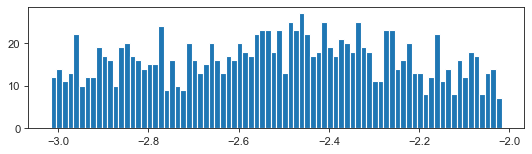

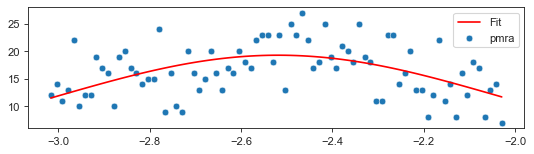

pmra upper bound: -1.05
pmra lower bound: -3.99
cluster length: 1313

 df_Berkeley_7_new


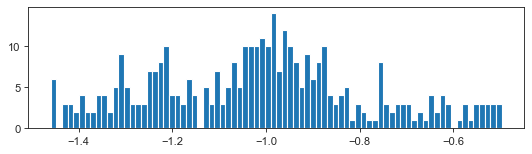

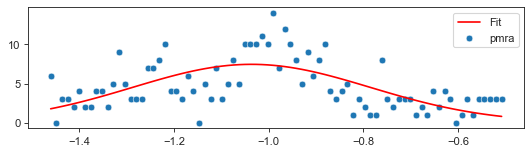

pmra upper bound: -0.29
pmra lower bound: -1.79
cluster length: 372

 df_Collinder_69_new


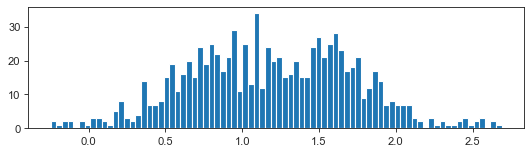

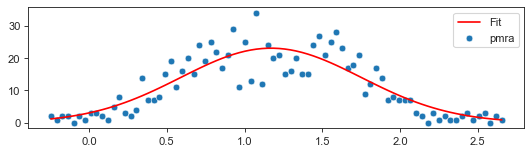

pmra upper bound: 2.91
pmra lower bound: -0.57
cluster length: 890

 df_IC_4996_new


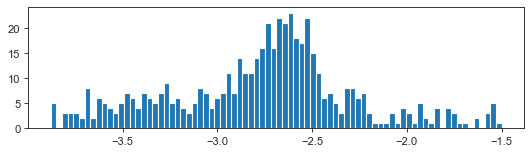

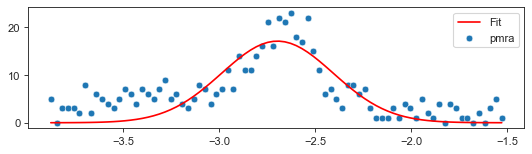

pmra upper bound: -1.83
pmra lower bound: -3.57
cluster length: 467

 df_Bochum_10_new


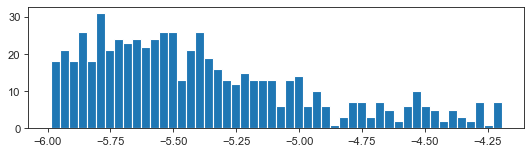

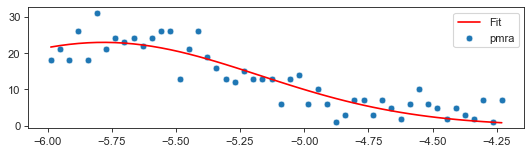

pmra upper bound: -3.96
pmra lower bound: -7.6
cluster length: 640

 df_NGC_2362_new


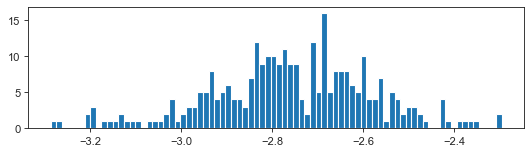

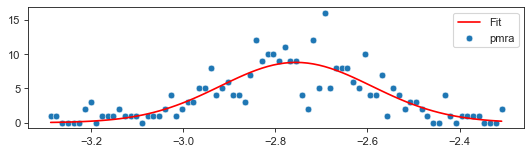

pmra upper bound: -2.26
pmra lower bound: -3.25
cluster length: 297

 df_Collinder_232_new


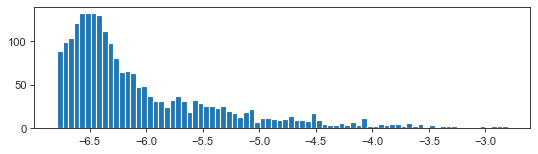

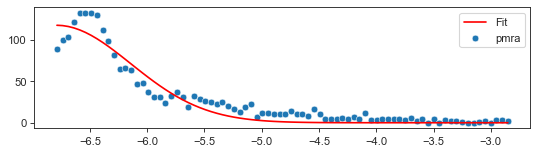

pmra upper bound: -4.85
pmra lower bound: -8.74
cluster length: 2053

 df_Hogg_10_new


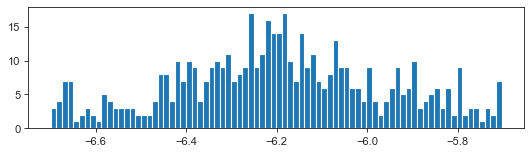

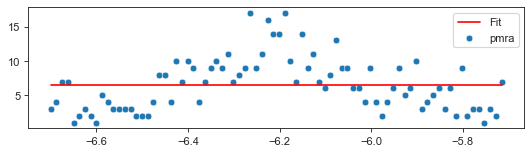

pmra upper bound: 402653187.99
pmra lower bound: -402653185.99
cluster length: 522

 df_NGC_6618_new


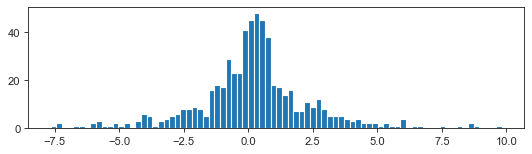

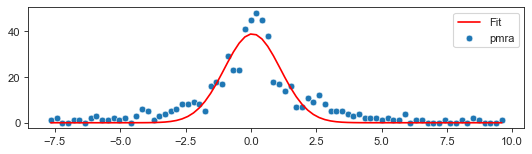

pmra upper bound: 3.27
pmra lower bound: -3.16
cluster length: 519

 df_NGC_6231_new


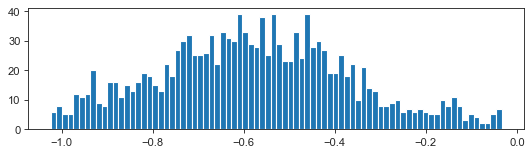

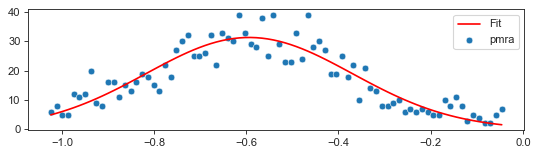

pmra upper bound: 0.08
pmra lower bound: -1.27
cluster length: 1391


In [21]:
df_NGC_6823_new = guassian_fit_filter(df_NGC_6823_new, 'pmra', 50)
df_Haffner_18_new = guassian_fit_filter(df_Haffner_18_new, 'pmra', 70)
df_Haffner_19_new = guassian_fit_filter(df_Haffner_19_new, 'pmra', 50)
df_NGC_7160_new = guassian_fit_filter(df_NGC_7160_new, 'pmra', 30)
df_NGC_6193_new = guassian_fit_filter(df_NGC_6193_new, 'pmra')
df_NGC_2401_new = guassian_fit_filter(df_NGC_2401_new, 'pmra', 30)
df_NGC_2384_new = guassian_fit_filter(df_NGC_2384_new, 'pmra', 30)
df_NGC_6871_new = guassian_fit_filter(df_NGC_6871_new, 'pmra')
df_NGC_7380_new = guassian_fit_filter(df_NGC_7380_new, 'pmra')
df_Berkeley_7_new = guassian_fit_filter(df_Berkeley_7_new, 'pmra')
df_Collinder_69_new = guassian_fit_filter(df_Collinder_69_new, 'pmra')
df_IC_4996_new = guassian_fit_filter(df_IC_4996_new, 'pmra')
df_Bochum_10_new = guassian_fit_filter(df_Bochum_10_new, 'pmra', 50)
df_NGC_2362_new = guassian_fit_filter(df_NGC_2362_new, 'pmra')
df_Collinder_232_new = guassian_fit_filter(df_Collinder_232_new, 'pmra')
df_Hogg_10_new = guassian_fit_filter(df_Hogg_10_new, 'pmra')
df_NGC_6618_new = guassian_fit_filter(df_NGC_6618_new, 'pmra')
df_NGC_6231_new = guassian_fit_filter(df_NGC_6231_new, 'pmra')


 df_NGC_6823_new


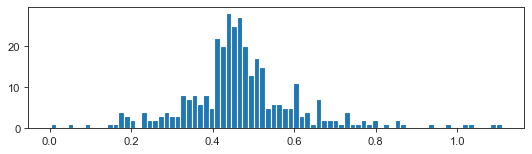

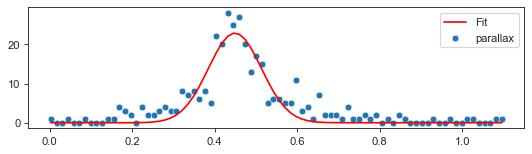

parallax upper bound: 0.64
parallax lower bound: 0.26
cluster length: 289

 df_Haffner_18_new


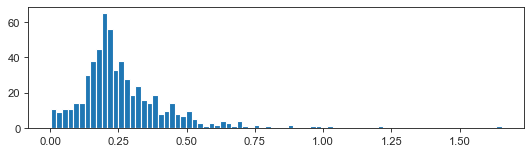

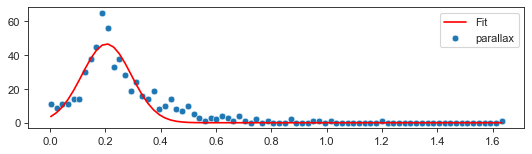

parallax upper bound: 0.47
parallax lower bound: -0.06
cluster length: 532

 df_Haffner_19_new


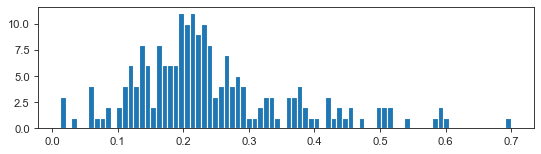

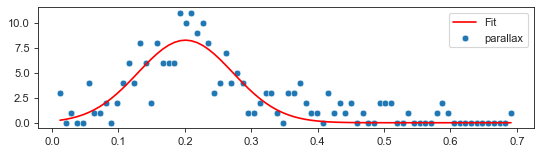

parallax upper bound: 0.42
parallax lower bound: -0.01
cluster length: 183

 df_NGC_7160_new


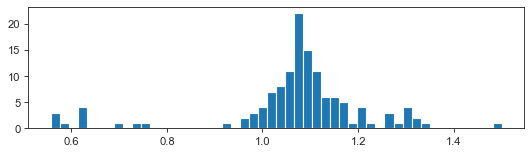

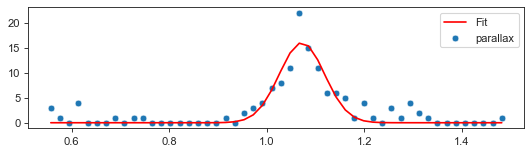

parallax upper bound: 1.21
parallax lower bound: 0.93
cluster length: 105

 df_NGC_6193_new


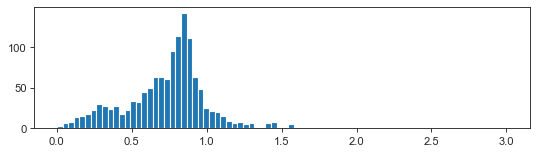

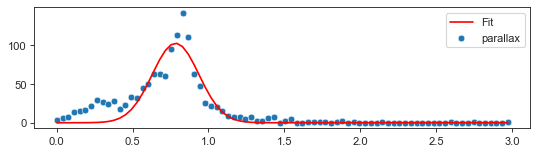

parallax upper bound: 1.24
parallax lower bound: 0.32
cluster length: 1134

 df_NGC_2401_new


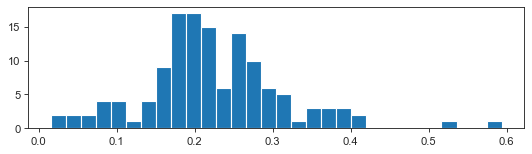

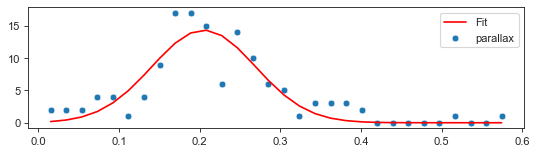

parallax upper bound: 0.4
parallax lower bound: 0.01
cluster length: 128

 df_NGC_2384_new


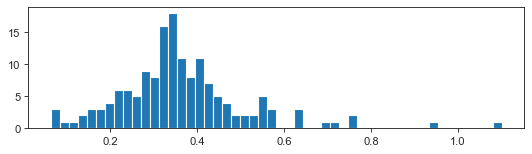

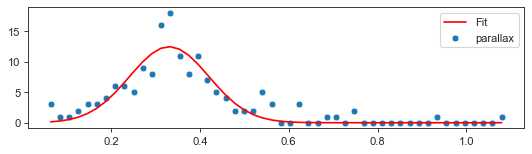

parallax upper bound: 0.6
parallax lower bound: 0.06
cluster length: 145

 df_NGC_6871_new


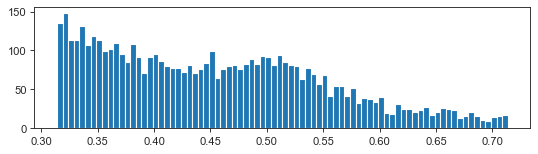

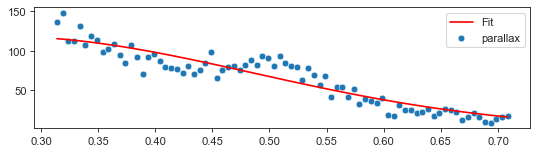

parallax upper bound: 0.93
parallax lower bound: -0.41
cluster length: 5167

 df_NGC_7380_new


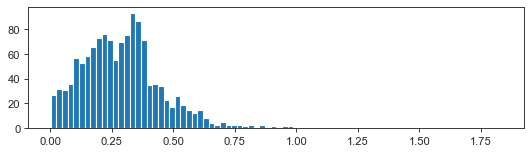

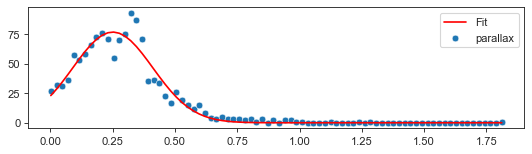

parallax upper bound: 0.73
parallax lower bound: -0.23
cluster length: 1285

 df_Berkeley_7_new


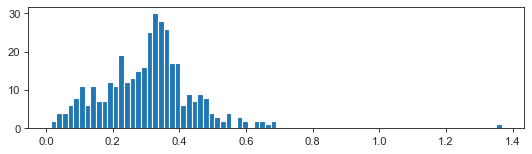

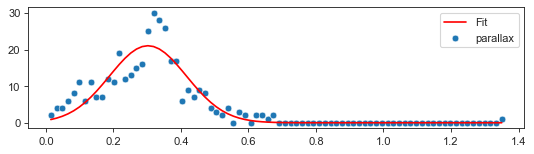

parallax upper bound: 0.64
parallax lower bound: -0.04
cluster length: 366

 df_Collinder_69_new


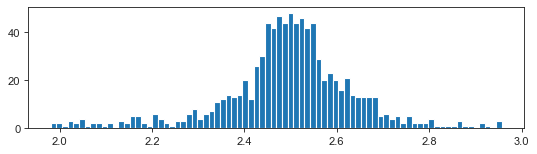

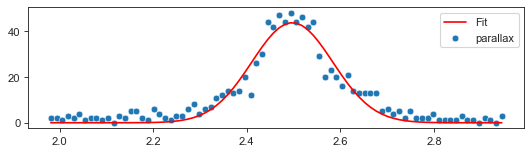

parallax upper bound: 2.76
parallax lower bound: 2.24
cluster length: 813

 df_IC_4996_new


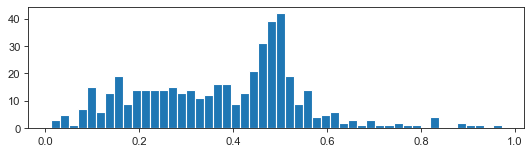

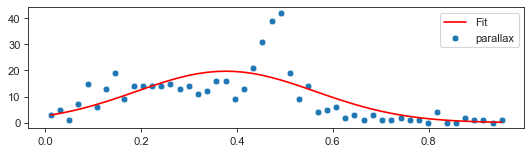

parallax upper bound: 0.94
parallax lower bound: -0.18
cluster length: 466

 df_Bochum_10_new


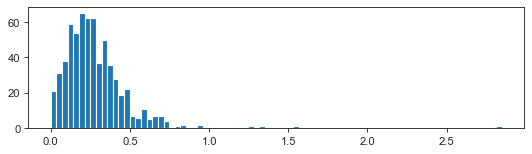

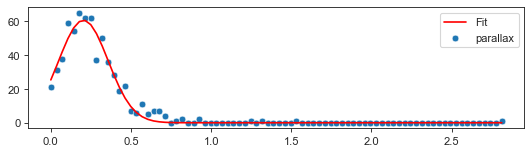

parallax upper bound: 0.67
parallax lower bound: -0.26
cluster length: 619

 df_NGC_2362_new


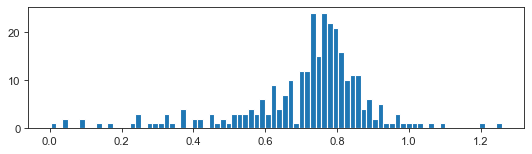

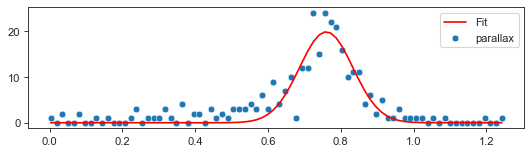

parallax upper bound: 0.98
parallax lower bound: 0.54
cluster length: 250

 df_Collinder_232_new


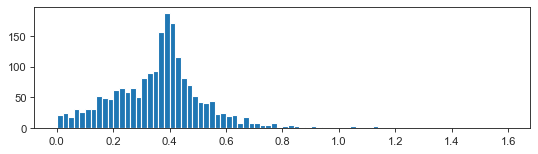

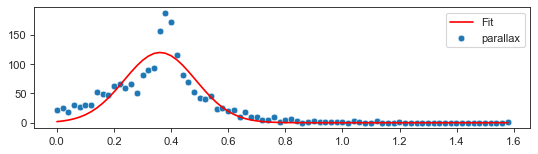

parallax upper bound: 0.74
parallax lower bound: -0.01
cluster length: 2003

 df_Hogg_10_new


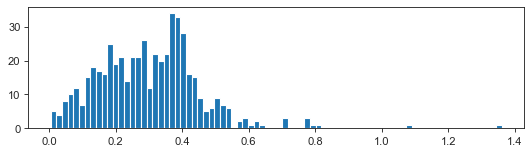

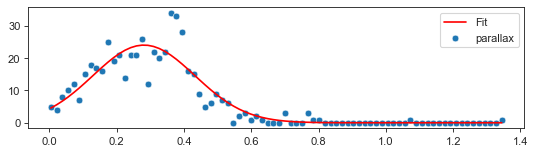

parallax upper bound: 0.74
parallax lower bound: -0.17
cluster length: 515

 df_NGC_6618_new


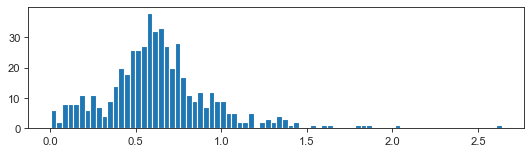

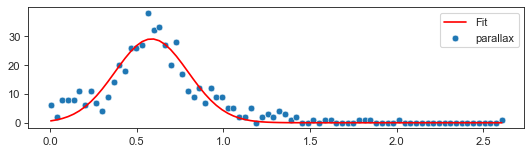

parallax upper bound: 1.22
parallax lower bound: -0.05
cluster length: 494

 df_NGC_6231_new


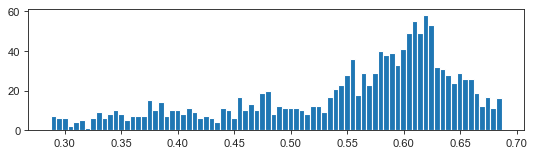

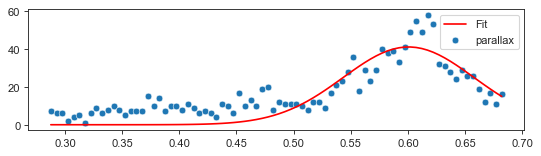

parallax upper bound: 0.77
parallax lower bound: 0.43
cluster length: 1178


In [22]:
df_NGC_6823_new = guassian_fit_filter(df_NGC_6823_new, 'parallax')
df_Haffner_18_new = guassian_fit_filter(df_Haffner_18_new, 'parallax')
df_Haffner_19_new = guassian_fit_filter(df_Haffner_19_new, 'parallax')
df_NGC_7160_new = guassian_fit_filter(df_NGC_7160_new, 'parallax', 50) #
df_NGC_6193_new = guassian_fit_filter(df_NGC_6193_new, 'parallax')
df_NGC_2401_new = guassian_fit_filter(df_NGC_2401_new, 'parallax', 30)
df_NGC_2384_new = guassian_fit_filter(df_NGC_2384_new, 'parallax', 50)
df_NGC_6871_new = guassian_fit_filter(df_NGC_6871_new, 'parallax')
df_NGC_7380_new = guassian_fit_filter(df_NGC_7380_new, 'parallax')
df_Berkeley_7_new = guassian_fit_filter(df_Berkeley_7_new, 'parallax')
df_Collinder_69_new = guassian_fit_filter(df_Collinder_69_new, 'parallax')
df_IC_4996_new = guassian_fit_filter(df_IC_4996_new, 'parallax', 50)
df_Bochum_10_new = guassian_fit_filter(df_Bochum_10_new, 'parallax')
df_NGC_2362_new = guassian_fit_filter(df_NGC_2362_new, 'parallax')
df_Collinder_232_new = guassian_fit_filter(df_Collinder_232_new, 'parallax')
df_Hogg_10_new = guassian_fit_filter(df_Hogg_10_new, 'parallax')
df_NGC_6618_new = guassian_fit_filter(df_NGC_6618_new, 'parallax') 
df_NGC_6231_new = guassian_fit_filter(df_NGC_6231_new, 'parallax')

### plot after fitting

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Times


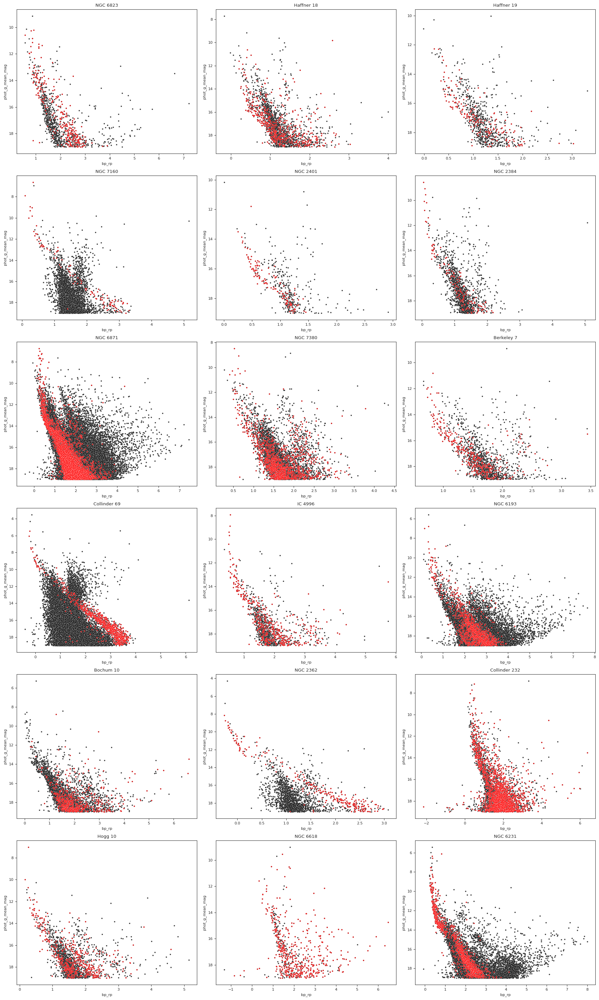

In [23]:
def cmd_plotly(data, x_axis, y_axis, ax=None, alpha=0.8, s=8):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)
    ax.invert_yaxis()


with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)
    
    cmd_plotly(df_NGC_6823, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 0])
    cmd_plotly(df_NGC_6823_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 0])
    axes[0, 0].invert_yaxis()
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 1])
    cmd_plotly(df_Haffner_18_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 1])
    axes[0, 1].invert_yaxis()
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 2])
    cmd_plotly(df_Haffner_19_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[0, 2])
    axes[0, 2].invert_yaxis()
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 0])
    cmd_plotly(df_NGC_7160_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 0])
    axes[1, 0].invert_yaxis()
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 1])
    cmd_plotly(df_NGC_2401_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 1])
    axes[1, 1].invert_yaxis()
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 2])
    cmd_plotly(df_NGC_2384_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[1, 2])
    axes[1, 2].invert_yaxis()
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 0])
    cmd_plotly(df_NGC_6871_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 0])
    axes[2, 0].invert_yaxis()
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 1])
    cmd_plotly(df_NGC_7380_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 1])
    axes[2, 1].invert_yaxis()
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 2])
    cmd_plotly(df_Berkeley_7_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[2, 2])
    axes[2, 2].invert_yaxis()
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 0])
    cmd_plotly(df_Collinder_69_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 0])
    axes[3, 0].invert_yaxis()
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 1])
    cmd_plotly(df_IC_4996_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 1])
    axes[3, 1].invert_yaxis()
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 2])
    cmd_plotly(df_NGC_6193_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[3, 2])
    axes[3, 2].invert_yaxis()
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 0])
    cmd_plotly(df_Bochum_10_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 0])
    axes[4, 0].invert_yaxis()
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 1])
    cmd_plotly(df_NGC_2362_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 1])
    axes[4, 1].invert_yaxis()
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 2])
    cmd_plotly(df_Collinder_232_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[4, 2])
    axes[4, 2].invert_yaxis()
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 0])
    cmd_plotly(df_Hogg_10_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 0])
    axes[5, 0].invert_yaxis()
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 1])
    cmd_plotly(df_NGC_6618_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 1])
    axes[5, 1].invert_yaxis()
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 2])
    cmd_plotly(df_NGC_6231_new, 'bp_rp', 'phot_g_mean_mag', ax=axes[5, 2])
    axes[5, 2].invert_yaxis()
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

# Minimum Spanning Tree

In [24]:
def min_span_tree(df_data, num_std = 0, sort_plot = False):
    
    np.random.seed(101)
    
    df_data = df_data.reset_index().drop('index', axis=1)
    data = df_data.copy()
    scaler = StandardScaler()
    data[['r_med_geo', 'ra', 'dec']] = scaler.fit_transform(data[['r_med_geo', 'ra', 'dec']])
    
    nn = NearestNeighbors(n_neighbors=3, metric='minkowski')
    nn.fit(data[['r_med_geo', 'ra', 'dec']])
    distances, indices = nn.kneighbors(data[['r_med_geo', 'ra', 'dec']])

    # Create an empty graph
    G = nx.Graph()

    # Add edges with distances to the graph
    n_samples = data.shape[0]
    for i in range(n_samples):
        for j in range(1, len(indices[i])):
            neighbor_index = indices[i, j]
            weight = distances[i, j]
            G.add_edge(i, neighbor_index, weight=weight)

    # Compute the minimum spanning tree
    mst = nx.minimum_spanning_tree(G)

    # Calculate the mean weight of the MST
    edge_weights = [X['weight'] for _, _, X in mst.edges(data=True)]
    threshold = np.mean(edge_weights) + num_std * np.std(edge_weights)

    
    if sort_plot:
        # Sort the edge weights in ascending order
        sorted_weights = sorted(edge_weights)

#         threshold = 0.85
        # Plot sorted edge weights
        plt.plot(sorted_weights)
        plt.hlines(.85, 0,300, colors='red')
        plt.xlabel('Edge Index')
        plt.ylabel('Edge Weight')
        plt.title('Sorted Edge Weights')
        plt.show()
    
    # Identify the nodes with weights greater than the mean weight
    nodes_to_remove = [node for node in mst.nodes() if mst.degree(node, weight='weight') > threshold]

    # Remove the identified nodes from the MST
    mst.remove_nodes_from(nodes_to_remove)

    df_data['MST_cluster'] = 1
    df_data.loc[nodes_to_remove, 'MST_cluster'] = 0
    
    return df_data

In [25]:
df_NGC_6823_new = min_span_tree(df_NGC_6823_new, num_std = 3)
df_Haffner_18_new = min_span_tree(df_Haffner_18_new, num_std = 3)
df_Haffner_19_new = min_span_tree(df_Haffner_19_new, num_std = 3)
df_NGC_7160_new = min_span_tree(df_NGC_7160_new, num_std = 3)
df_NGC_6193_new = min_span_tree(df_NGC_6193_new, num_std = 3)
df_NGC_2401_new = min_span_tree(df_NGC_2401_new, num_std = 3)
df_NGC_2384_new = min_span_tree(df_NGC_2384_new, num_std = 3)
df_NGC_6871_new = min_span_tree(df_NGC_6871_new, num_std = 3)
df_NGC_7380_new = min_span_tree(df_NGC_7380_new, num_std = 3)
df_Berkeley_7_new = min_span_tree(df_Berkeley_7_new, num_std = 3)
df_Collinder_69_new = min_span_tree(df_Collinder_69_new, num_std = 3)
df_IC_4996_new = min_span_tree(df_IC_4996_new, num_std = 3)
df_Bochum_10_new = min_span_tree(df_Bochum_10_new, num_std = 3)
df_NGC_2362_new = min_span_tree(df_NGC_2362_new, num_std = 3)
df_Collinder_232_new = min_span_tree(df_Collinder_232_new, num_std = 3)
df_Hogg_10_new = min_span_tree(df_Hogg_10_new, num_std = 3)
df_NGC_6618_new = min_span_tree(df_NGC_6618_new, num_std = 3)
df_NGC_6231_new = min_span_tree(df_NGC_6231_new, num_std = 3)

In [26]:
def cmd_plotly(data, x_axis, y_axis, huex = 'cluster', ax=None, alpha=0.8, s=15):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, hue = huex, ax=ax)
    ax.invert_yaxis()

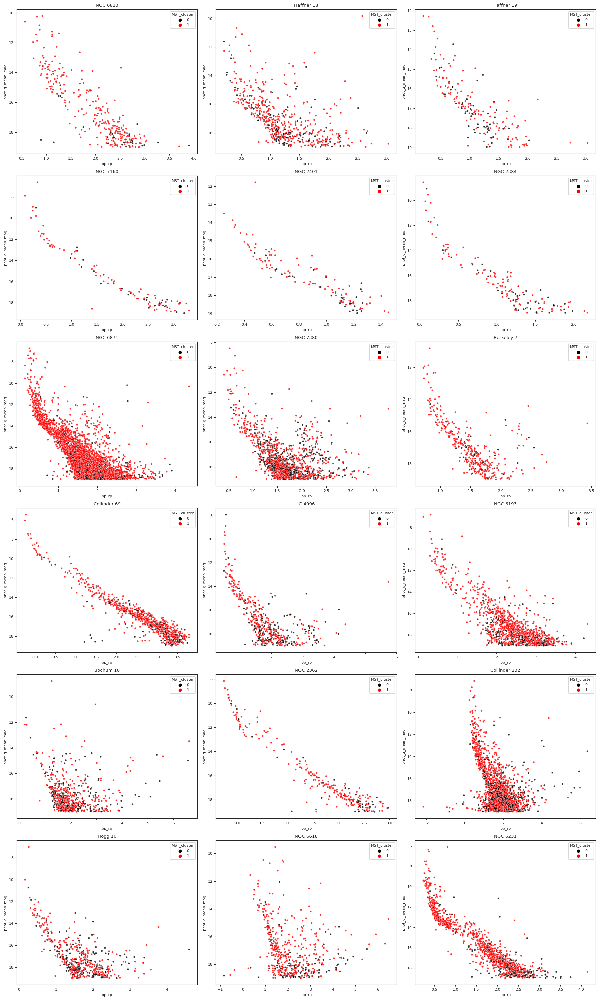

In [27]:
with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    cmd_plotly(df_NGC_6823_new, 'bp_rp', 'phot_g_mean_mag', huex='MST_cluster', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231_new, 'bp_rp', 'phot_g_mean_mag', huex = 'MST_cluster', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

----

# GAUSSIAN MIXTURE

In [28]:
# params = ['pmra', 'pmdec', 'parallax']

def gassian_mixture(data, parameters = ['pmra', 'pmdec', 'parallax', 'ra', 'dec']):
    np.random.seed(101)
    gm = GaussianMixture(n_components=2, random_state=101)
    
    y_pred = gm.fit_predict(data[parameters])
    y_prob = gm.predict_proba(data[parameters])
    
    data['cluster'] = y_pred
    data['prob'] = np.amax(y_prob,axis=1)
    return data

In [29]:
df_NGC_6823_new = gassian_mixture(df_NGC_6823_new[df_NGC_6823_new['MST_cluster']==1])
df_Haffner_18_new = gassian_mixture(df_Haffner_18_new[df_Haffner_18_new['MST_cluster']==1])
df_Haffner_19_new = gassian_mixture(df_Haffner_19_new[df_Haffner_19_new['MST_cluster']==1])
df_NGC_7160_new = gassian_mixture(df_NGC_7160_new[df_NGC_7160_new['MST_cluster']==1])
df_NGC_6193_new = gassian_mixture(df_NGC_6193_new[df_NGC_6193_new['MST_cluster']==1])
df_NGC_2401_new = gassian_mixture(df_NGC_2401_new[df_NGC_2401_new['MST_cluster']==1])
df_NGC_2384_new = gassian_mixture(df_NGC_2384_new[df_NGC_2384_new['MST_cluster']==1])
df_NGC_6871_new = gassian_mixture(df_NGC_6871_new[df_NGC_6871_new['MST_cluster']==1])
df_NGC_7380_new = gassian_mixture(df_NGC_7380_new[df_NGC_7380_new['MST_cluster']==1])
df_Berkeley_7_new = gassian_mixture(df_Berkeley_7_new[df_Berkeley_7_new['MST_cluster']==1])
df_Collinder_69_new = gassian_mixture(df_Collinder_69_new[df_Collinder_69_new['MST_cluster']==1])
df_IC_4996_new = gassian_mixture(df_IC_4996_new[df_IC_4996_new['MST_cluster']==1])
df_Bochum_10_new = gassian_mixture(df_Bochum_10_new[df_Bochum_10_new['MST_cluster']==1])
df_NGC_2362_new = gassian_mixture(df_NGC_2362_new[df_NGC_2362_new['MST_cluster']==1])
df_Collinder_232_new = gassian_mixture(df_Collinder_232_new[df_Collinder_232_new['MST_cluster']==1])
df_Hogg_10_new = gassian_mixture(df_Hogg_10_new[df_Hogg_10_new['MST_cluster']==1])
df_NGC_6618_new = gassian_mixture(df_NGC_6618_new[df_NGC_6618_new['MST_cluster']==1])
df_NGC_6231_new = gassian_mixture(df_NGC_6231_new[df_NGC_6231_new['MST_cluster']==1])

In [30]:
def cmd_plotly(data, x_axis, y_axis, huex = 'cluster', ax=None, alpha=0.8, s=15):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, hue = huex, ax=ax)
    ax.invert_yaxis()

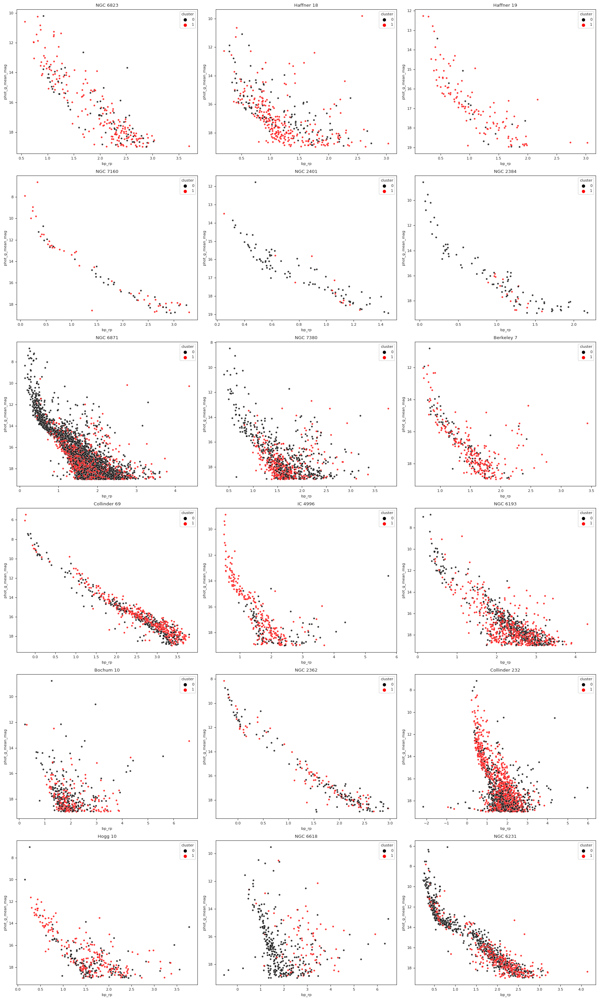

In [31]:
with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    cmd_plotly(df_NGC_6823_new, 'bp_rp', 'phot_g_mean_mag', huex='cluster', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231_new, 'bp_rp', 'phot_g_mean_mag', huex = 'cluster', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

***NGC_2384 Results are not compatible with Simbda values!!!***  
***NGC 6618 seems to be cluster 1 but there are few samples!!!***  
***NGC 6231 maybe two clusters on each other!!*** or Maybe just because its in spiral!!


In [41]:
def cmd_plotly(data, x_axis, y_axis, huex = 'cluster', ax=None, alpha=0.8, s=15):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, hue = huex, ax=ax)
    ax.invert_yaxis()
    
    
def plot_cluster_histograms(df):
    print('1:',len(df[df['cluster'] == 1]))
    print('0:',len(df[df['cluster'] == 0]))
    
    # Create a figure and subplots with a 3x2 grid
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 8))

    # Plotting the first histogram
    sns.histplot(data=df[df['cluster'] == 1], x='pmra', ax=axes[0, 0])
    axes[0, 0].set_title('Cluster 1')

    # Plotting the second histogram
    sns.histplot(data=df[df['cluster'] == 0], x='pmra', ax=axes[0, 1])
    axes[0, 1].set_title('Cluster 0')

    sns.histplot(data=df[df['cluster'] == 1], x='pmdec', ax=axes[1, 0])
    sns.histplot(data=df[df['cluster'] == 0], x='pmdec', ax=axes[1, 1])

    sns.histplot(data=df[df['cluster'] == 1], x='parallax', ax=axes[2, 0])
    sns.histplot(data=df[df['cluster'] == 0], x='parallax', ax=axes[2, 1])

    # Adjust the spacing between subplots
    plt.tight_layout()

    # Display the plot
    plt.show()
    
    with plt.style.context(['ieee']):
        fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=100)

        cmd_plotly(df[df['cluster'] == 0], 'bp_rp', 'phot_g_mean_mag', huex='cluster', ax=axes[0])
        cmd_plotly(df[df['cluster'] == 1], 'bp_rp', 'phot_g_mean_mag', huex='cluster', ax=axes[1])  

1: 212
0: 149


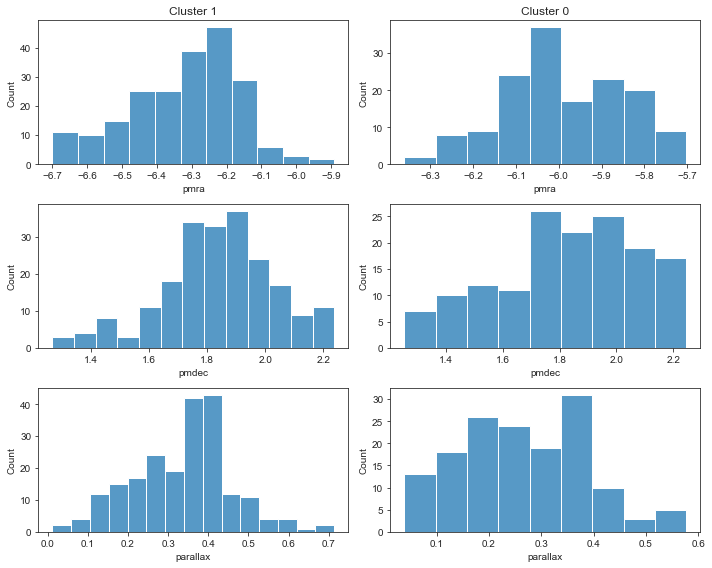

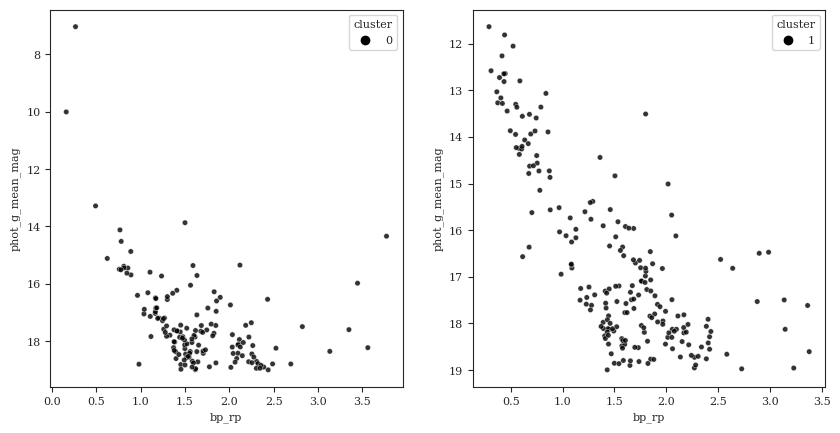

In [42]:
plot_cluster_histograms(df_Hogg_10_new)

### clusters

In [43]:
df_NGC_6823_cluster = df_NGC_6823_new[(df_NGC_6823_new['cluster']==1) & (df_NGC_6823_new['MST_cluster']==1) & (df_NGC_6823_new['prob']>.8)]
df_Haffner_18_cluster = df_Haffner_18_new[(df_Haffner_18_new['cluster']==0) & (df_Haffner_18_new['MST_cluster']==1) & (df_Haffner_18_new['prob']>.8)]
df_Haffner_19_cluster = df_Haffner_19_new[(df_Haffner_19_new['cluster']==1) & (df_Haffner_19_new['MST_cluster']==1) & (df_Haffner_19_new['prob']>.8)]
df_NGC_7160_cluster = df_NGC_7160_new[(df_NGC_7160_new['MST_cluster']==1) & (df_NGC_7160_new['prob']>.8)] # (df_NGC_7160_new['cluster']==1) & 
df_NGC_6193_cluster = df_NGC_6193_new[(df_NGC_6193_new['cluster']==0) & (df_NGC_6193_new['MST_cluster']==1) & (df_NGC_6193_new['prob']>.8)]
df_NGC_2401_cluster = df_NGC_2401_new[(df_NGC_2401_new['cluster']==0) & (df_NGC_2401_new['MST_cluster']==1) & (df_NGC_2401_new['prob']>.8)]
df_NGC_2384_cluster = df_NGC_2384_new[(df_NGC_2384_new['cluster']==0) & (df_NGC_2384_new['MST_cluster']==1) & (df_NGC_2384_new['prob']>.8)]
df_NGC_6871_cluster = df_NGC_6871_new[(df_NGC_6871_new['cluster']==0) & (df_NGC_6871_new['MST_cluster']==1) & (df_NGC_6871_new['prob']>.8)]
df_NGC_7380_cluster = df_NGC_7380_new[(df_NGC_7380_new['cluster']==0) & (df_NGC_7380_new['MST_cluster']==1) & (df_NGC_7380_new['prob']>.8)]
df_Berkeley_7_cluster = df_Berkeley_7_new[(df_Berkeley_7_new['cluster']==1) & (df_Berkeley_7_new['MST_cluster']==1) & (df_Berkeley_7_new['prob']>.8)]
df_Collinder_69_cluster = df_Collinder_69_new[(df_Collinder_69_new['MST_cluster']==1) & (df_Collinder_69_new['prob']>.8)]
df_IC_4996_cluster = df_IC_4996_new[(df_IC_4996_new['cluster']==1) & (df_IC_4996_new['MST_cluster']==1) & (df_IC_4996_new['prob']>.8)]
df_Bochum_10_cluster = df_Bochum_10_new[(df_Bochum_10_new['cluster']==0) & (df_Bochum_10_new['MST_cluster']==1) & (df_Bochum_10_new['prob']>.8)]
df_NGC_2362_cluster = df_NGC_2362_new[(df_NGC_2362_new['MST_cluster']==1) & (df_NGC_2362_new['prob']>.8)]
df_Collinder_232_cluster = df_Collinder_232_new[(df_Collinder_232_new['cluster']==1) & (df_Collinder_232_new['MST_cluster']==1) & (df_Collinder_232_new['prob']>.8)]
df_Hogg_10_cluster = df_Hogg_10_new[(df_Hogg_10_new['cluster']==1) & (df_Hogg_10_new['MST_cluster']==1) & (df_Hogg_10_new['prob']>.8)]
df_NGC_6618_cluster = df_NGC_6618_new[(df_NGC_6618_new['cluster']==0) & (df_NGC_6618_new['MST_cluster']==1) & (df_NGC_6618_new['prob']>.8)]
df_NGC_6231_cluster = df_NGC_6231_new[(df_NGC_6231_new['cluster']==0) & (df_NGC_6231_new['MST_cluster']==1) & (df_NGC_6231_new['prob']>.8)]

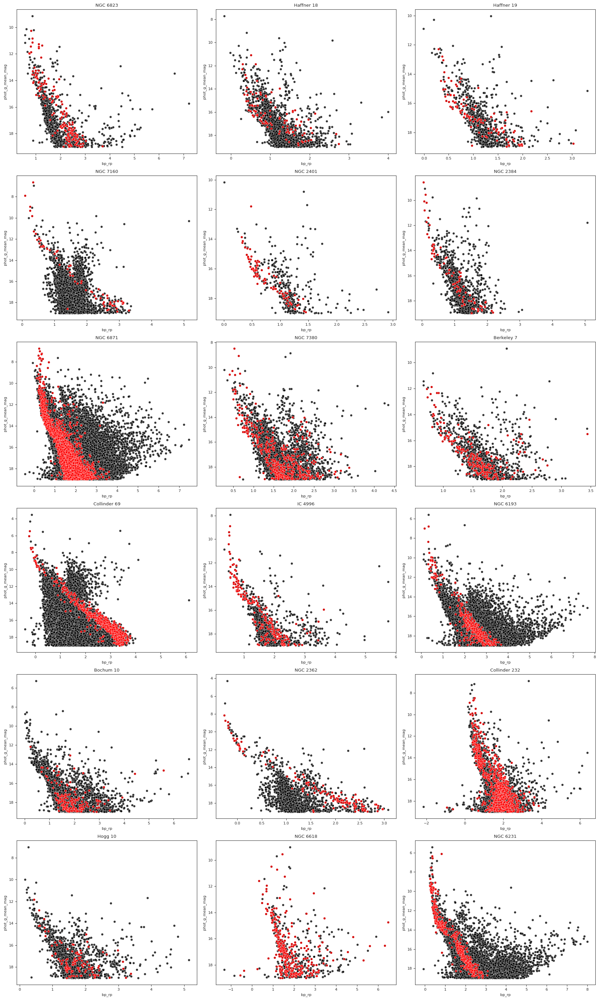

In [44]:
def cmd_plotly(data, x_axis, y_axis, ax=None, alpha=0.8, s=15):
    """
    -------
    plot isochrone
    -------
    """
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)
    ax.invert_yaxis()

with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)
    
    cmd_plotly(df_NGC_6823, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 0])
    cmd_plotly(df_NGC_6823_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 0])
    axes[0, 0].invert_yaxis()
    axes[0, 0].set_title('NGC 6823')

    cmd_plotly(df_Haffner_18, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 1])
    cmd_plotly(df_Haffner_18_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 1])
    axes[0, 1].invert_yaxis()
    axes[0, 1].set_title('Haffner 18')

    cmd_plotly(df_Haffner_19, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 2])
    cmd_plotly(df_Haffner_19_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[0, 2])
    axes[0, 2].invert_yaxis()
    axes[0, 2].set_title('Haffner 19')

    cmd_plotly(df_NGC_7160, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 0])
    cmd_plotly(df_NGC_7160_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 0])
    axes[1, 0].invert_yaxis()
    axes[1, 0].set_title('NGC 7160')

    cmd_plotly(df_NGC_2401, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 1])
    cmd_plotly(df_NGC_2401_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 1])
    axes[1, 1].invert_yaxis()
    axes[1, 1].set_title('NGC 2401')

    cmd_plotly(df_NGC_2384, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 2])
    cmd_plotly(df_NGC_2384_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[1, 2])
    axes[1, 2].invert_yaxis()
    axes[1, 2].set_title('NGC 2384')

    cmd_plotly(df_NGC_6871, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 0])
    cmd_plotly(df_NGC_6871_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 0])
    axes[2, 0].invert_yaxis()
    axes[2, 0].set_title('NGC 6871')

    cmd_plotly(df_NGC_7380, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 1])
    cmd_plotly(df_NGC_7380_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 1])
    axes[2, 1].invert_yaxis()
    axes[2, 1].set_title('NGC 7380')

    cmd_plotly(df_Berkeley_7, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 2])
    cmd_plotly(df_Berkeley_7_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[2, 2])
    axes[2, 2].invert_yaxis()
    axes[2, 2].set_title('Berkeley 7')

    cmd_plotly(df_Collinder_69, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 0])
    cmd_plotly(df_Collinder_69_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 0])
    axes[3, 0].invert_yaxis()
    axes[3, 0].set_title('Collinder 69')

    cmd_plotly(df_IC_4996, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 1])
    cmd_plotly(df_IC_4996_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 1])
    axes[3, 1].invert_yaxis()
    axes[3, 1].set_title('IC 4996')
    
    cmd_plotly(df_NGC_6193, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 2])
    cmd_plotly(df_NGC_6193_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[3, 2])
    axes[3, 2].invert_yaxis()
    axes[3, 2].set_title('NGC 6193')
    
    cmd_plotly(df_Bochum_10, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 0])
    cmd_plotly(df_Bochum_10_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 0])
    axes[4, 0].invert_yaxis()
    axes[4, 0].set_title('Bochum 10')

    cmd_plotly(df_NGC_2362, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 1])
    cmd_plotly(df_NGC_2362_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 1])
    axes[4, 1].invert_yaxis()
    axes[4, 1].set_title('NGC 2362')

    cmd_plotly(df_Collinder_232, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 2])
    cmd_plotly(df_Collinder_232_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[4, 2])
    axes[4, 2].invert_yaxis()
    axes[4, 2].set_title('Collinder 232')
    
    cmd_plotly(df_Hogg_10, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 0])
    cmd_plotly(df_Hogg_10_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 0])
    axes[5, 0].invert_yaxis()
    axes[5, 0].set_title('Hogg 10')

    cmd_plotly(df_NGC_6618, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 1])
    cmd_plotly(df_NGC_6618_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 1])
    axes[5, 1].invert_yaxis()
    axes[5, 1].set_title('NGC 6618')

    cmd_plotly(df_NGC_6231, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 2])
    cmd_plotly(df_NGC_6231_cluster, 'bp_rp', 'phot_g_mean_mag', s=25, ax=axes[5, 2])
    axes[5, 2].invert_yaxis()
    axes[5, 2].set_title('NGC 6231')


    plt.tight_layout()
    plt.show()

## ΔE(B - G)

In [61]:
def color_excess_BP_RP(data):
    return round((data['bp_rp'].nlargest(5).mean() - data['bp_rp'].nsmallest(5).mean()), 3)

def color_excess_BP_G(data):
    return round((data['bp_g'].nlargest(5).mean() - data['bp_g'].nsmallest(5).mean()), 3)

In [62]:
def convert_to_cluster_name(string):
    """
    Convert string to cluster name format.
    Example:
        "df_NGC_6823_cluster" -> "NGC 6823"
    """
    # Remove "df_" and "_cluster" from the string
    without_prefix = string.replace("df_", "").replace("_cluster", "").replace("_new", "")
    
    # Split the string by underscores and capitalize each word
    words = without_prefix.split("_")
    capitalized_words = [word.upper() for word in words]
    
    # Join the words with a space
    cluster_name = " ".join(capitalized_words)
    
    return cluster_name

In [63]:
bp_g_clusters = {}

In [64]:
bp_g_clusters[convert_to_cluster_name(namestr(df_Berkeley_7_cluster, globals())[0])] = color_excess_BP_G(df_Berkeley_7_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Bochum_10_cluster, globals())[0])] = color_excess_BP_G(df_Bochum_10_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Collinder_232_cluster, globals())[0])] = color_excess_BP_G(df_Collinder_232_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Collinder_69_cluster, globals())[0])] = color_excess_BP_G(df_Collinder_69_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Haffner_18_cluster, globals())[0])] = color_excess_BP_G(df_Haffner_18_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Haffner_19_cluster, globals())[0])] = color_excess_BP_G(df_Haffner_19_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_Hogg_10_cluster, globals())[0])] = color_excess_BP_G(df_Hogg_10_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_IC_4996_cluster, globals())[0])] = color_excess_BP_G(df_IC_4996_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_2362_cluster, globals())[0])] = color_excess_BP_G(df_NGC_2362_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_2384_cluster, globals())[0])] = color_excess_BP_G(df_NGC_2384_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_2401_cluster, globals())[0])] = color_excess_BP_G(df_NGC_2401_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_6193_cluster, globals())[0])] = color_excess_BP_G(df_NGC_6193_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_6231_cluster, globals())[0])] = color_excess_BP_G(df_NGC_6231_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_6618_cluster, globals())[0])] = color_excess_BP_G(df_NGC_6618_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_6823_cluster, globals())[0])] = color_excess_BP_G(df_NGC_6823_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_6871_cluster, globals())[0])] = color_excess_BP_G(df_NGC_6871_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_7160_cluster, globals())[0])] = color_excess_BP_G(df_NGC_7160_cluster)
bp_g_clusters[convert_to_cluster_name(namestr(df_NGC_7380_cluster, globals())[0])] = color_excess_BP_G(df_NGC_7380_cluster)

In [65]:
clusters['Name'] = clusters['Name'].apply(convert_to_cluster_name)
bp_g_clusters = pd.DataFrame(list(bp_g_clusters.items()), columns=['Name', 'delta_bp_g'])
clusters = clusters.merge(bp_g_clusters, how='left')

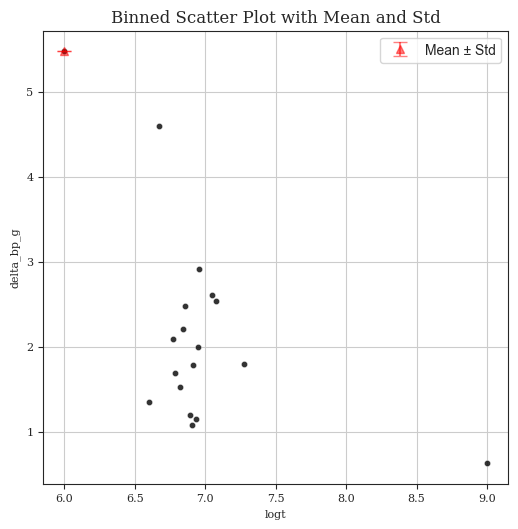

In [66]:
# Define bin edges
bins = np.linspace(6.0, 9.0, num=9) # 4

# Calculate bin statistics
bin_means, bin_edges, binnumber = stats.binned_statistic(clusters['logt'], clusters['delta_bp_g'],
                                                         statistic='mean', bins=bins)

bin_std, _, _ = stats.binned_statistic(clusters['logt'], clusters['delta_bp_g'],
                                 statistic='std', bins=bins)

# Scatter plot with error bars
# sns.scatterplot(clusters['logt'], clusters['delta_bp_rp'], color='black')
cmd_plot(clusters, 'logt', 'delta_bp_g', alpha=.8, s=20)
plt.errorbar(bin_edges[:-1], bin_means, yerr=bin_std, fmt='^',
            alpha=0.5, color='r', ecolor='r', capsize=5, label='Mean ± Std')

# Plot settings
plt.xlabel('logt')
plt.ylabel('delta_bp_g')
plt.title('Binned Scatter Plot with Mean and Std')
plt.legend()
plt.gca().invert_yaxis()
plt.grid(True)

# Show the plot
plt.show()

# Color excess ratios!

### G-R vs B-R

In [67]:
def black_body_plot(data, x_axis, y_axis, ax=None, alpha=0.8, s=15):
    
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)

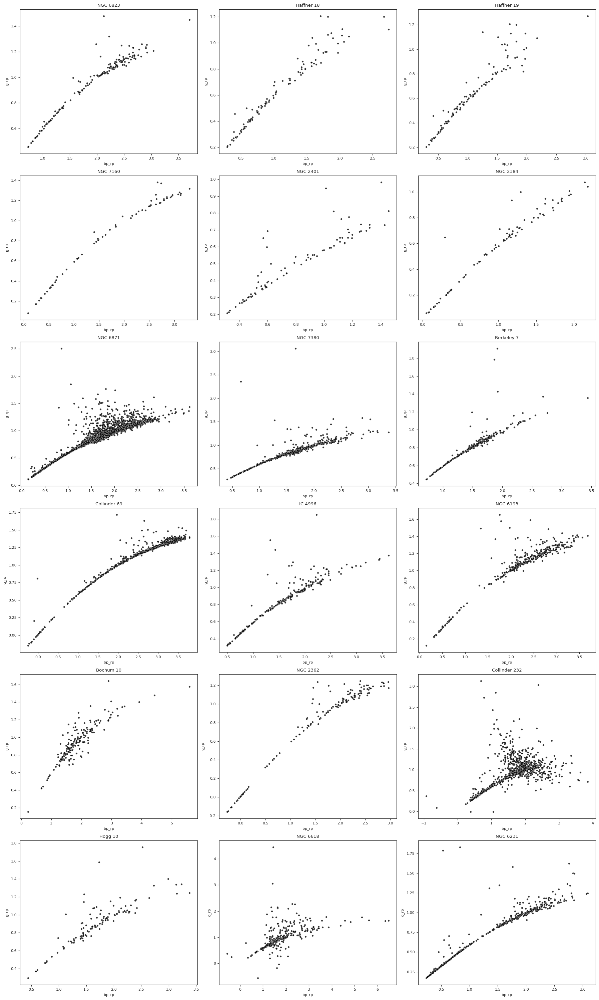

In [68]:
with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    black_body_plot(df_NGC_6823_cluster, 'bp_rp', 'g_rp', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    black_body_plot(df_Haffner_18_cluster, 'bp_rp', 'g_rp', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    black_body_plot(df_Haffner_19_cluster, 'bp_rp', 'g_rp', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    black_body_plot(df_NGC_7160_cluster, 'bp_rp', 'g_rp', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    black_body_plot(df_NGC_2401_cluster, 'bp_rp', 'g_rp', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    black_body_plot(df_NGC_2384_cluster, 'bp_rp', 'g_rp', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    black_body_plot(df_NGC_6871_cluster, 'bp_rp', 'g_rp', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    black_body_plot(df_NGC_7380_cluster, 'bp_rp', 'g_rp', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    black_body_plot(df_Berkeley_7_cluster, 'bp_rp', 'g_rp', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    black_body_plot(df_Collinder_69_cluster, 'bp_rp', 'g_rp', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    black_body_plot(df_IC_4996_cluster, 'bp_rp', 'g_rp', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    black_body_plot(df_NGC_6193_cluster, 'bp_rp', 'g_rp', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    black_body_plot(df_Bochum_10_cluster, 'bp_rp', 'g_rp', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    black_body_plot(df_NGC_2362_cluster, 'bp_rp', 'g_rp', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    black_body_plot(df_Collinder_232_cluster, 'bp_rp', 'g_rp', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    black_body_plot(df_Hogg_10_cluster, 'bp_rp', 'g_rp', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    black_body_plot(df_NGC_6618_cluster, 'bp_rp', 'g_rp', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    black_body_plot(df_NGC_6231_cluster, 'bp_rp', 'g_rp', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')
    
    
    plt.tight_layout()
    plt.show()

### B-G vs B-R  

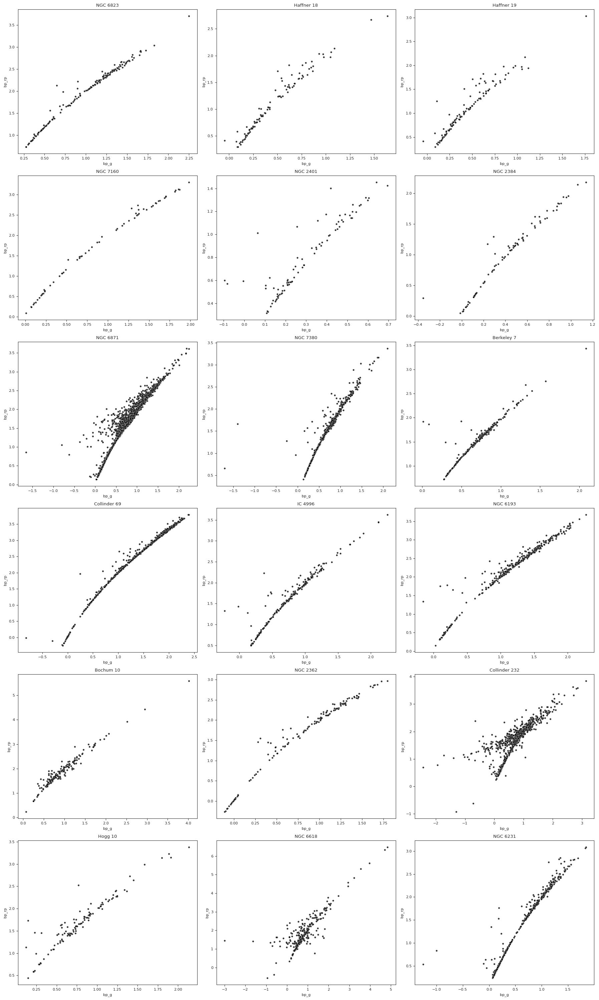

In [69]:
def black_body_plot(data, x_axis, y_axis, ax=None, alpha=0.8, s=15):
    
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)

with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    black_body_plot(df_NGC_6823_cluster, 'bp_g', 'bp_rp', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    black_body_plot(df_Haffner_18_cluster, 'bp_g', 'bp_rp', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    black_body_plot(df_Haffner_19_cluster, 'bp_g', 'bp_rp', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    black_body_plot(df_NGC_7160_cluster, 'bp_g', 'bp_rp', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    black_body_plot(df_NGC_2401_cluster, 'bp_g', 'bp_rp', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    black_body_plot(df_NGC_2384_cluster, 'bp_g', 'bp_rp', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    black_body_plot(df_NGC_6871_cluster, 'bp_g', 'bp_rp', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    black_body_plot(df_NGC_7380_cluster, 'bp_g', 'bp_rp', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    black_body_plot(df_Berkeley_7_cluster, 'bp_g', 'bp_rp', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    black_body_plot(df_Collinder_69_cluster, 'bp_g', 'bp_rp', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    black_body_plot(df_IC_4996_cluster, 'bp_g', 'bp_rp', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    black_body_plot(df_NGC_6193_cluster, 'bp_g', 'bp_rp', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    black_body_plot(df_Bochum_10_cluster, 'bp_g', 'bp_rp', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    black_body_plot(df_NGC_2362_cluster, 'bp_g', 'bp_rp', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    black_body_plot(df_Collinder_232_cluster, 'bp_g', 'bp_rp', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    black_body_plot(df_Hogg_10_cluster, 'bp_g', 'bp_rp', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    black_body_plot(df_NGC_6618_cluster, 'bp_g', 'bp_rp', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    black_body_plot(df_NGC_6231_cluster, 'bp_g', 'bp_rp', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')
    
    
    plt.tight_layout()
    plt.show()

### G-R vs B-G

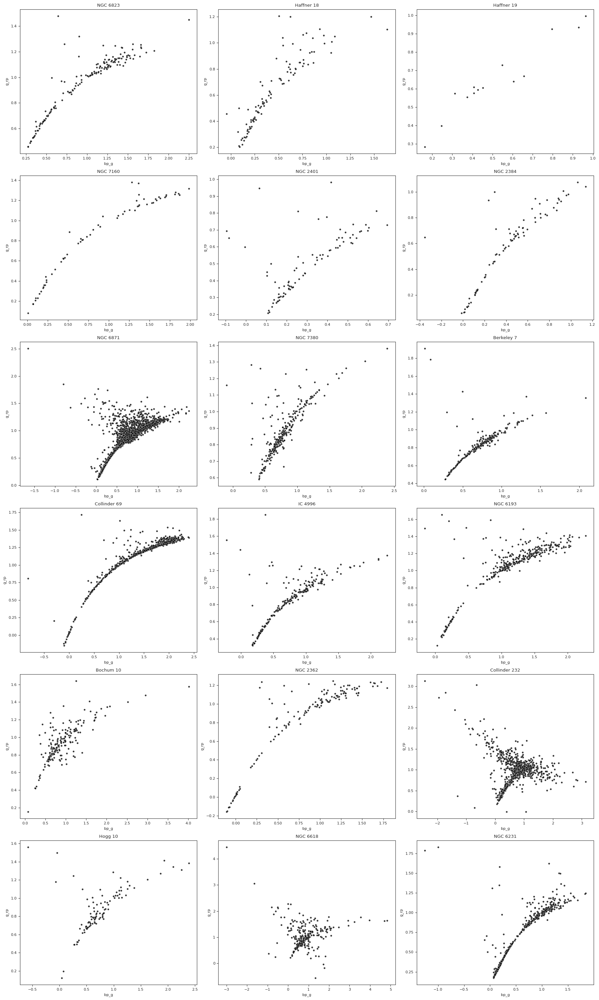

In [63]:
def black_body_plot(data, x_axis, y_axis, ax=None, alpha=0.8, s=15):
    
    if ax is None:
        fig = plt.figure(figsize=(4,8), dpi=100)
        ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s, ax=ax)

with plt.style.context(['ieee']):
    fig, axes = plt.subplots(6, 3, figsize=(18, 30), dpi=100)

    black_body_plot(df_NGC_6823_cluster, 'bp_g', 'g_rp', ax=axes[0, 0])
    axes[0, 0].set_title('NGC 6823')

    black_body_plot(df_Haffner_18_cluster, 'bp_g', 'g_rp', ax=axes[0, 1])
    axes[0, 1].set_title('Haffner 18')

    black_body_plot(df_Haffner_19_cluster, 'bp_g', 'g_rp', ax=axes[0, 2])
    axes[0, 2].set_title('Haffner 19')

    black_body_plot(df_NGC_7160_cluster, 'bp_g', 'g_rp', ax=axes[1, 0])
    axes[1, 0].set_title('NGC 7160')

    black_body_plot(df_NGC_2401_cluster, 'bp_g', 'g_rp', ax=axes[1, 1])
    axes[1, 1].set_title('NGC 2401')

    black_body_plot(df_NGC_2384_cluster, 'bp_g', 'g_rp', ax=axes[1, 2])
    axes[1, 2].set_title('NGC 2384')

    black_body_plot(df_NGC_6871_cluster, 'bp_g', 'g_rp', ax=axes[2, 0])
    axes[2, 0].set_title('NGC 6871')

    black_body_plot(df_NGC_7380_cluster, 'bp_g', 'g_rp', ax=axes[2, 1])
    axes[2, 1].set_title('NGC 7380')

    black_body_plot(df_Berkeley_7_cluster, 'bp_g', 'g_rp', ax=axes[2, 2])
    axes[2, 2].set_title('Berkeley 7')

    black_body_plot(df_Collinder_69_cluster, 'bp_g', 'g_rp', ax=axes[3, 0])
    axes[3, 0].set_title('Collinder 69')

    black_body_plot(df_IC_4996_cluster, 'bp_g', 'g_rp', ax=axes[3, 1])
    axes[3, 1].set_title('IC 4996')
    
    black_body_plot(df_NGC_6193_cluster, 'bp_g', 'g_rp', ax=axes[3, 2])
    axes[3, 2].set_title('NGC 6193')
    
    black_body_plot(df_Bochum_10_cluster, 'bp_g', 'g_rp', ax=axes[4, 0])
    axes[4, 0].set_title('Bochum 10')

    black_body_plot(df_NGC_2362_cluster, 'bp_g', 'g_rp', ax=axes[4, 1])
    axes[4, 1].set_title('NGC 2362')

    black_body_plot(df_Collinder_232_cluster, 'bp_g', 'g_rp', ax=axes[4, 2])
    axes[4, 2].set_title('Collinder 232')
    
    black_body_plot(df_Hogg_10_cluster, 'bp_g', 'g_rp', ax=axes[5, 0])
    axes[5, 0].set_title('Hogg 10')

    black_body_plot(df_NGC_6618_cluster, 'bp_g', 'g_rp', ax=axes[5, 1])
    axes[5, 1].set_title('NGC 6618')

    black_body_plot(df_NGC_6231_cluster, 'bp_g', 'g_rp', ax=axes[5, 2])
    axes[5, 2].set_title('NGC 6231')
    
    
    plt.tight_layout()
    plt.show()

----

----

# B-R vs Mv

Apparent $V$ magnitudes are converted into absolute magnitude $M_V$ by the relation $M_V = V −(5logd−5 + A_V)$ where $A_V = 3.25*E(B − V)$

to conert this to $E(B-R)$ :

$
A_v = 3.25 * (A_R - A_B) / (R_b - 3.25) * E(B-R)  
$  

$
M_V = V −(5logd−5) - A_v
$

There is only a shift for Av so I use this:

$
A_v = 3.25 * E(B-R)  
$  

$
M_V = V −(5logd−5) - A_v
$

In [70]:
def add_Gmg(cluster, init_cluster):
    return cluster.merge(init_cluster[['ra','Gmg']], how='left')

In [71]:
df_NGC_6823_cluster = add_Gmg(df_NGC_6823_cluster, df_NGC_6823)
df_Haffner_18_cluster = add_Gmg(df_Haffner_18_cluster, df_Haffner_18)
df_Haffner_19_cluster = add_Gmg(df_Haffner_19_cluster, df_Haffner_19)
df_NGC_7160_cluster = add_Gmg(df_NGC_7160_cluster, df_NGC_7160)
df_NGC_6193_cluster = add_Gmg(df_NGC_6193_cluster, df_NGC_6193)
df_NGC_2401_cluster = add_Gmg(df_NGC_2401_cluster, df_NGC_2401)
df_NGC_2384_cluster = add_Gmg(df_NGC_2384_cluster, df_NGC_2384)
df_NGC_6871_cluster = add_Gmg(df_NGC_6871_cluster, df_NGC_6871)
df_NGC_7380_cluster = add_Gmg(df_NGC_7380_cluster, df_NGC_7380)
df_Berkeley_7_cluster = add_Gmg(df_Berkeley_7_cluster, df_Berkeley_7)
df_Collinder_69_cluster = add_Gmg(df_Collinder_69_cluster, df_Collinder_69)
df_IC_4996_cluster = add_Gmg(df_IC_4996_cluster, df_IC_4996)
df_Bochum_10_cluster = add_Gmg(df_Bochum_10_cluster, df_Bochum_10)
df_NGC_2362_cluster = add_Gmg(df_NGC_2362_cluster, df_NGC_2362)
df_Collinder_232_cluster = add_Gmg(df_Collinder_232_cluster, df_Collinder_232)
df_Hogg_10_cluster = add_Gmg(df_Hogg_10_cluster, df_Hogg_10)
df_NGC_6618_cluster = add_Gmg(df_NGC_6618_cluster, df_NGC_6618)
df_NGC_6231_cluster = add_Gmg(df_NGC_6231_cluster, df_NGC_6231)

In [72]:
dataframes = [df_NGC_6823_cluster, df_Haffner_18_cluster, df_Haffner_19_cluster, df_NGC_7160_cluster, df_NGC_6193_cluster, df_NGC_2401_cluster, df_NGC_2384_cluster, df_NGC_6871_cluster, df_NGC_7380_cluster, df_Berkeley_7_cluster, df_Collinder_69_cluster, df_IC_4996_cluster, df_Bochum_10_cluster, df_NGC_2362_cluster, df_Collinder_232_cluster, df_Hogg_10_cluster, df_NGC_6618_cluster, df_NGC_6231_cluster]

In [73]:
for cluster in dataframes:
    cluster['Gmg2'] = cluster['Gmg'] - (3.25 * .7 * cluster['bp_g'])

In [74]:
def color_exc_to_Gmg(data, x_axis = 'Gmg2', y_axis = 'bp_g', alpha=0.5, s=15, num_bins=10):
    # Define bin edges
    bins = np.linspace(data[x_axis].min(), data[x_axis].max(), num=num_bins)

    # Calculate bin statistics
    bin_means, bin_edges, binnumber = stats.binned_statistic(data[x_axis], data[y_axis], statistic='mean', bins=bins)
    bin_std, _, _ = stats.binned_statistic(data[x_axis], data[y_axis], statistic='std', bins=bins)

    # Scatter plot with error bars
    fig = plt.figure(figsize=(6,3), dpi=100)
    ax = fig.add_subplot(111)
    sns.scatterplot(data=data, y=y_axis, x=x_axis, alpha=alpha, s=s)
    plt.errorbar(bin_edges[:-1], bin_means, yerr=bin_std, fmt='^',
                alpha=alpha, color='r', ecolor='r', capsize=5, label='Mean ± Std')
    
    plt.title(convert_to_cluster_name(namestr(data, globals())[0]))
    plt.legend()
    plt.grid(True)

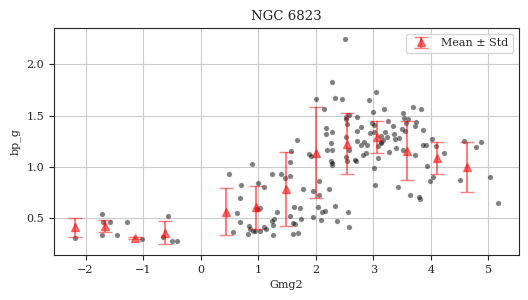

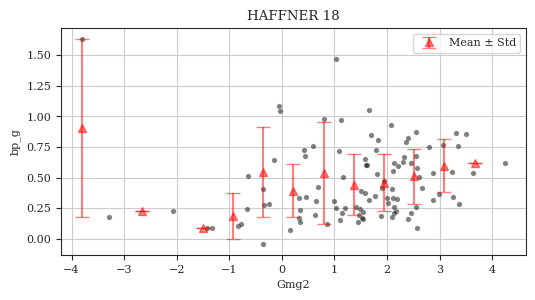

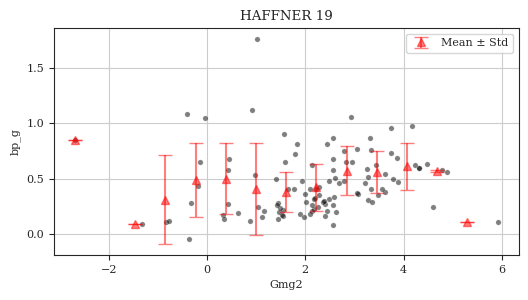

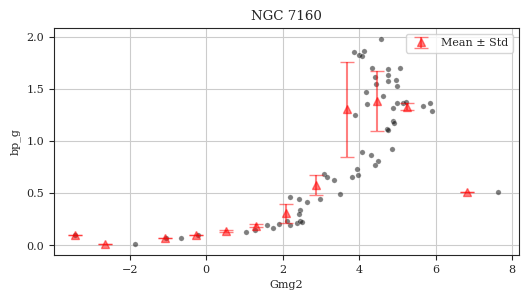

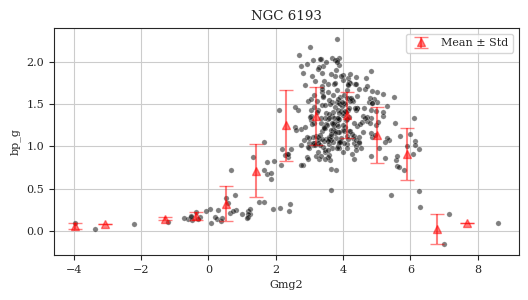

...

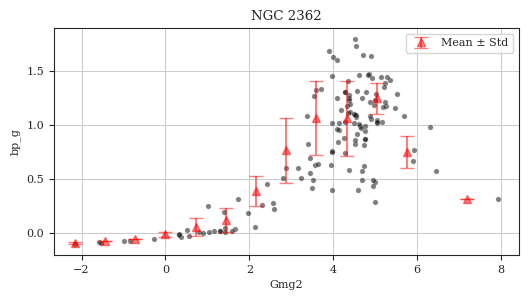

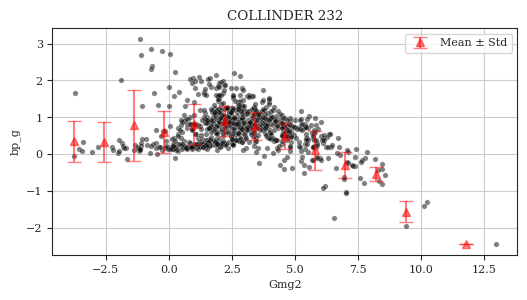

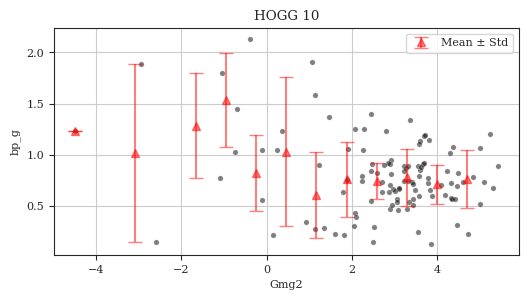

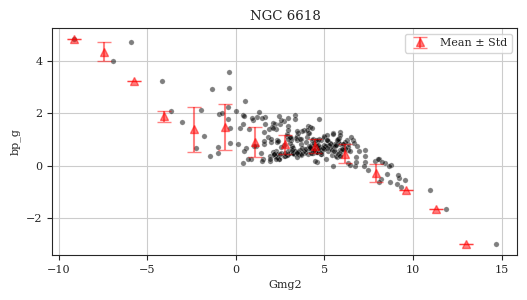

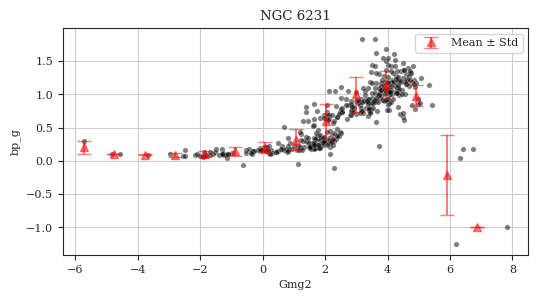

In [75]:
with plt.style.context(['ieee']):
    
    for cluster in dataframes:
        color_exc_to_Gmg(cluster, 'Gmg2', 'bp_g', num_bins=15)

# King Profile

$
ρ(r) = \frac{ρ_0}{1 + \left(\frac{r}{r_c}\right)^2} - f_b \cdot ρ_b(r) + f_0 \cdot ρ_0
$  
where:

ρ(r) is the stellar density at a given radius r,  
ρ_0 is the central stellar density,  
r_c is the core radius,  
f_b is the fraction of stars bound to the cluster,  
ρ_b(r) is the density profile of the bound stars, and  
f_0 is the fraction of field stars contributing to the background level of density.  

In the equation, the term - $f_b \cdot ρ_b(r)$ represents the contribution of the bound stars to the density profile, and the term + $f_0 \cdot ρ_0$ represents the contribution of the field stars to the background density.

$
f(r) = \frac{f_0}{1 + \left(\frac{r}{R_c}\right)^2} + f_b 
$  

In [76]:
def king_profile_function(x, f_b, f_0, R_c):
    return (f_b + (f_0 / (1 + (x/R_c)**2)))

In [77]:
def fit_king_profile(data, plotting = True, norm_density=False):
    """
    returns coefs: [f_b, f_0, R_c], R_t
    """
    
    center = (np.mean(data['ra']), np.mean(data['dec']))  # center of cluster
    max_r = round(max(np.linalg.norm(center - data[['ra', 'dec']], axis=1)), 2) + 0.01
    
    radii = np.linspace(0, max_r, 13)  # Define the radii of the concentric circles
    x = np.linspace(0, max_r, num=100)

    # star density
    star_densities = []  
    for i in range(len(radii) - 1):
        r_inner = radii[i]
        r_outer = radii[i + 1]

        # Calculate the distances between the center and each star's position
        distances = np.sqrt((data['ra'] - center[0])**2 + (data['dec'] - center[1])**2)

        # Count the number of stars within the current circle
        stars_within_circle = data[(distances >= r_inner) & (distances < r_outer)]
        star_count = len(stars_within_circle)

        # Calculate the area of the circle
        circle_area = np.pi * (r_outer**2 - r_inner**2)

        # Calculate the star density within the circle
        star_density = star_count / circle_area
        star_densities.append(star_density)

    star_densities = np.array(star_densities)

    # normal density 
    normal_densities = star_densities / np.linalg.norm(star_densities)
    
    if norm_density:
        star_densities = normal_densities

    # fitting data on king profile
    coefs, cov = curve_fit(king_profile_function, radii[:-1], star_densities, maxfev=5000, bounds=[0, np.inf])

    R_tidal = coefs[2]*np.sqrt(coefs[1]/(3*np.sqrt(cov[0,0]))-1)
    
    if plotting:
        with plt.style.context(['ieee']):
            # Plotting the density profile
            plt.figure(figsize=(5,3), dpi=100)
            plt.plot(radii[:-1], star_densities, 'o', ms=4)
            plt.plot(x, king_profile_function(x, coefs[0], coefs[1], coefs[2]), '--')
            plt.title(convert_to_cluster_name(namestr(data, globals())[0]))
            plt.xlabel('Radius from Center')
            plt.ylabel('Star Density')
            plt.show()
    
    return coefs, R_tidal, cov

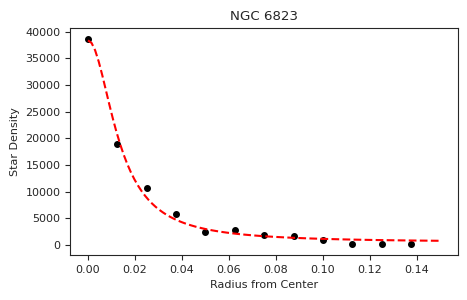

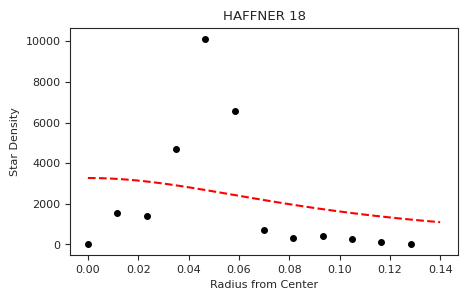

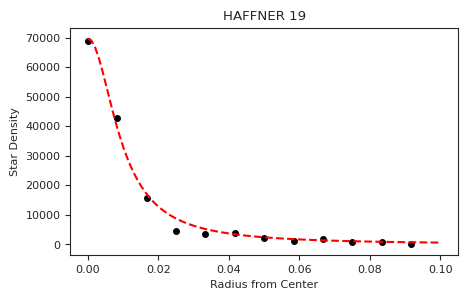

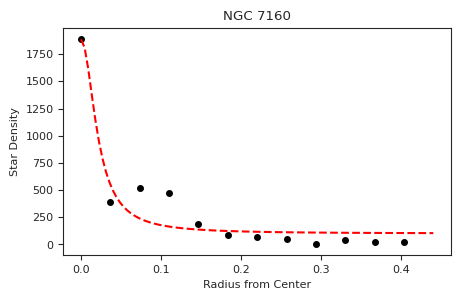

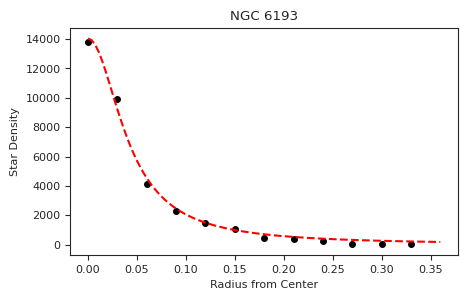

...

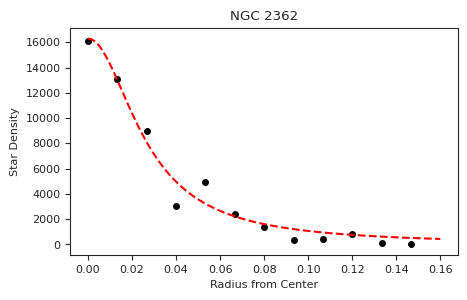

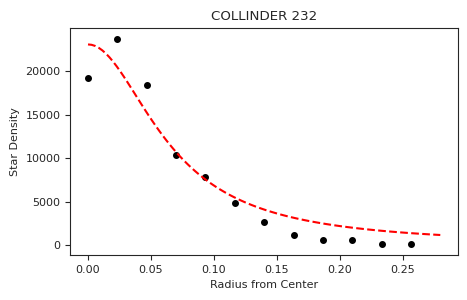

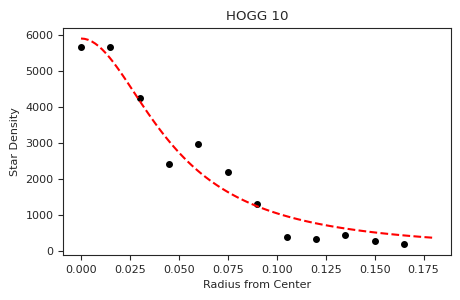

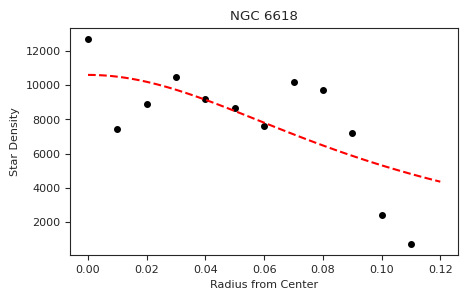

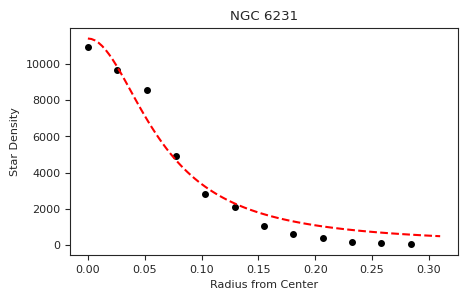

In [78]:
dataframes = [df_NGC_6823_cluster, df_Haffner_18_cluster, df_Haffner_19_cluster, df_NGC_7160_cluster, df_NGC_6193_cluster, df_NGC_2401_cluster, df_NGC_2384_cluster, df_NGC_6871_cluster, df_NGC_7380_cluster, df_Berkeley_7_cluster, df_Collinder_69_cluster, df_IC_4996_cluster, df_Bochum_10_cluster, df_NGC_2362_cluster, df_Collinder_232_cluster, df_Hogg_10_cluster, df_NGC_6618_cluster, df_NGC_6231_cluster]
coefs = np.ndarray((18, 3))  
R_t = np.ndarray((18,)) 
cov= np.ndarray((18,3,3))

for i, cluster in enumerate(dataframes):
    coefs[i], R_t[i], cov[i] = fit_king_profile(cluster, norm_density=False)

In [79]:
print('NGC 6823')
print("f_b:", round(coefs[0][0], 2), 'std:', round(np.sqrt(cov[0][0][0]), 5))
print("f_0:", round(coefs[0][1], 2))
print("R_c:", round(coefs[0][2], 2))
print('R_t:', round(R_t[0], 2))

NGC 6823
f_b: 483.27 std: 404.39108
f_0: 37874.22
R_c: 0.01
R_t: 0.07


-----